# Import

In [2]:
import os
import h5py
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import neurokit2 as nk

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import DBSCAN, HDBSCAN

from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans, KShape


,filename,subject,session,game,label
0,Participants_12_FS_638684941057812921_0_emotio...,12_FS,638684941057812921,canvas_painter,FRUSTRATED
1,Participants_12_FS_638684941057812921_1_emotio...,12_FS,638684941057812921,canvas_painter,FRUSTRATED
2,Participants_12_FS_638684941057812921_2_emotio...,12_FS,638684941057812921,canvas_painter,FRUSTRATED
3,Participants_12_FS_638684941057812921_3_emotio...,12_FS,638684941057812921,canvas_painter,FRUSTRATED
4,Participants_12_FS_638684941057812921_4_emotio...,12_FS,638684941057812921,canvas_painter,FRUSTRATED
...,...,...,...,...,...
1862,Participant_22_638696866261867627_5_emotion_EN...,22,638696866261867627,cube_stacking,ENGAGED
1863,Participant_22_638696866261867627_6_emotion_FR...,22,638696866261867627,cube_stacking,FRUSTRATED
1864,Participant_22_638696866261867627_7_emotion_FR...,22,638696866261867627,cube_stacking,FRUSTRATED
1865,Participant_22_638696866261867627_8_emotion_FR...,22,638696866261867627,cube_stacking,FRUSTRATED


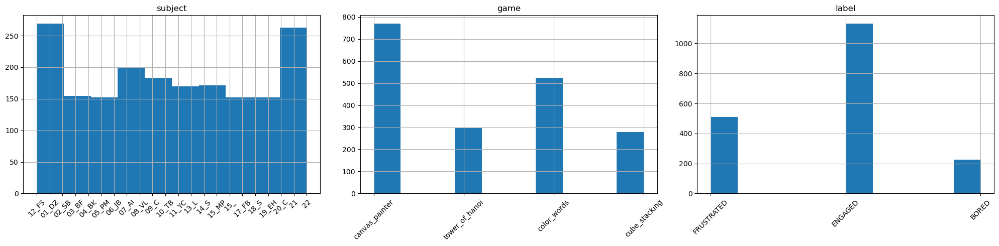

In [3]:
# After preprocessing
base_dir = "C:/Users/ismas/Documents/X2Learn/Personalization-Enablers-Training-Tools"
ssl_dir =  base_dir + "/outputs/XRoom/shimmer/standardize/"
ssl_example = os.listdir(ssl_dir)[0]

# Stack all segments
segments_df = pd.DataFrame(columns=["filename", "subject", "session", "game", "label"])
segments = []

pattern = (
    r"(?:Participant|Participants)_"
    r"(?P<participant>[A-Za-z0-9_]+?)_"
    r"(?P<session>\d+)_"
    r".+?_"
    r"emotion_(?P<emotion>[A-Z]+)_"
    r"game_(?P<game>[A-Za-z_]+)\.npy"
)

for file in os.listdir(ssl_dir):
    if file.endswith(".npy"):

        match = re.search(pattern, file)

        if not match:
            raise ValueError(f"Invalid filename format: {file}")

        segments_df = pd.concat([
            segments_df,
            pd.DataFrame([{
                "filename": file,
                "subject": match.group("participant"),
                "session": match.group("session"),
                "game": match.group("game"),
                "label": match.group("emotion"),
            }])
        ],
        ignore_index=True)
        segments.append(np.load(ssl_dir + file))

segments = np.stack(segments)
segments = segments[:,:, 0]

display(segments_df)

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

for i, col in enumerate(["subject", "game", "label"]):
    segments_df[col].hist(ax=axes[i])
    axes[i].set_title(col)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Extracting features and processing

In [4]:
from extract_features import extract_eda_features_from_raw

sampling_rate = 10

feature_rows = [
    extract_eda_features_from_raw(seg, sampling_rate)
    for seg in segments
]

X_features = pd.DataFrame(feature_rows)
X_features

c:\Users\ismas\anaconda3\envs\xr2\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
c:\Users\ismas\anaconda3\envs\xr2\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
c:\Users\ismas\anaconda3\envs\xr2\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
c:\Users\ismas\anaconda3\envs\xr2\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["SCR_Onsets"]), ~np.isnan(info["SCR_Onsets"])
c:\Users\ismas\anaconda3\envs\xr2\lib\site-packages\neurokit2\eda\eda_peaks.py:127: RuntimeWarning: All-NaN slice encountered
  info["SCR_Peaks"] > np.nanmin(info["

,gsr_phasic_mean,gsr_phasic_std,gsr_phasic_max,gsr_phasic_rms,gsr_phasic_auc,gsr_phasic_d1_mean_abs,gsr_phasic_d1_max_abs,gsr_tonic_mean,gsr_tonic_std,gsr_tonic_min,gsr_tonic_max,gsr_tonic_slope,gsr_tonic_delta,gsr_scr_count,gsr_scr_rate,gsr_scr_amp_mean,gsr_scr_amp_max,gsr_scr_amp_sum,gsr_scr_risetime_mean,gsr_scr_risetime_std
0,-0.204568,0.270579,0.248749,0.339206,-0.204568,0.025820,0.115720,-1.199265,0.231280,-1.384104,-0.607823,-0.071219,-0.764512,4.0,0.4,0.104299,0.238518,0.417198,0.500000,0.234521
1,0.004515,0.162834,0.196862,0.162897,0.004515,0.010337,0.042679,-0.820204,0.327496,-1.440001,-0.426617,0.111521,1.013384,3.0,0.3,0.057935,0.119555,0.173804,0.366667,0.094281
2,0.035126,0.031533,0.099296,0.047203,0.035126,0.008449,0.064119,0.033761,0.228003,-0.424018,0.299840,0.077236,0.723858,4.0,0.4,0.037050,0.068146,0.148199,0.300000,0.122474
3,0.010796,0.054300,0.118283,0.055363,0.010796,0.008372,0.063150,0.599702,0.152578,0.303963,0.782909,0.051916,0.478946,3.0,0.3,0.113705,0.157480,0.341116,1.033333,0.618241
4,-0.012543,0.040622,0.085654,0.042515,-0.012543,0.006836,0.033963,1.088882,0.140181,0.835430,1.267797,0.048054,0.432367,4.0,0.4,0.065221,0.159412,0.260883,0.725000,0.686932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1862,-0.033915,0.132420,0.196528,0.136694,-0.033915,0.012863,0.078208,1.118492,0.024374,1.090215,1.159570,0.007496,0.045303,5.0,0.5,0.026310,0.047417,0.131552,0.260000,0.120000
1863,0.017122,0.212977,0.535535,0.213664,0.017122,0.027922,0.121179,-1.333769,0.007381,-1.341980,-1.321614,-0.001787,0.002141,3.0,0.3,0.336410,0.572764,1.009229,0.900000,0.326599
1864,-0.003500,0.079503,0.097767,0.079580,-0.003500,0.014351,0.117981,-1.220738,0.140379,-1.485676,-1.047968,0.047926,0.437709,3.0,0.3,0.010609,0.018294,0.031826,0.266667,0.094281
1865,-0.015185,0.147966,0.233219,0.148743,-0.015185,0.015459,0.070107,-1.226923,0.085693,-1.387133,-1.121736,0.029216,0.265397,2.0,0.2,0.015493,0.028563,0.030986,0.350000,0.150000


### Standardize

In [5]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)

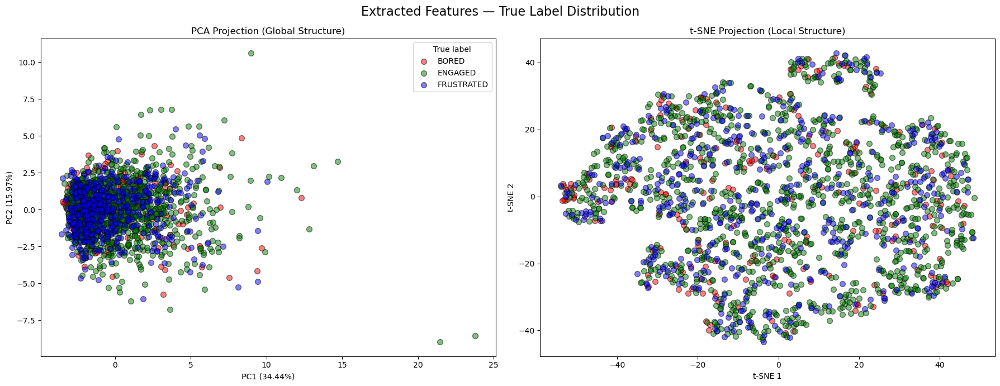

In [6]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

def plot_label_distribution(X_scaled, segments_df, name=None):
    """
    Visualize PCA and t-SNE projections colored by true labels.

    """

    y = segments_df["label"].values

    # PCA (global structure)
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    # t-SNE (local structure)
    tsne = TSNE(
        n_components=2,
        perplexity=30,
        learning_rate="auto",
        init="pca",
        random_state=42
    )
    X_tsne = tsne.fit_transform(X_scaled)

    # Unique labels for consistent coloring
    unique_labels = np.unique(y)
    cmap = ["red", "green", "blue"]

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(f"{name} — True Label Distribution", fontsize=16, y=0.98)

    # PCA plot
    for idx, label in enumerate(unique_labels):
        mask = y == label
        axes[0].scatter(
            X_pca[mask, 0],
            X_pca[mask, 1],
            s=50,
            alpha=0.5,
            label=str(label),
            color=cmap[idx],
            edgecolors="k"
        )

    axes[0].set_title("PCA Projection (Global Structure)")
    axes[0].set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
    axes[0].set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
    axes[0].legend(title="True label")

    # t-SNE plot
    for idx, label in enumerate(unique_labels):
        mask = y == label
        axes[1].scatter(
            X_tsne[mask, 0],
            X_tsne[mask, 1],
            s=50,
            alpha=0.5,
            label=str(label),
            color=cmap[idx],
            edgecolors="k"
        )

    axes[1].set_title("t-SNE Projection (Local Structure)")
    axes[1].set_xlabel("t-SNE 1")
    axes[1].set_ylabel("t-SNE 2")

    plt.tight_layout()
    plt.show()

plot_label_distribution(X_scaled, segments_df, "Extracted Features")

# Clustering algorithms


### Visualization

In [11]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


def plot_cluster_distribution(labels, name, k_value=None):
    plt.figure(figsize=(10, 5))
    counts, bins, patches = plt.hist(labels, bins=np.arange(labels.min(), labels.max() + 2) - 0.5, rwidth=0.8, color='skyblue', edgecolor='black')
    
    # Add number of samples on top of each bar
    for count, patch in zip(counts, patches):
        if count > 0:
            plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height(), str(int(count)), 
                     ha='center', va='bottom')
                     
    plt.title(f'Cluster Distribution: {name} with k={k_value}')
    plt.xlabel('Cluster Label')
    plt.ylabel('Number of Samples')
    plt.xticks(np.unique(labels))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

def plot_clustering(X_scaled, labels, name, centroids=np.array([]), k_value=None):
    
    # Reduce to 2D using PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # Reduce to 2D using t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    X_tsne = tsne.fit_transform(X_scaled)

    # Create figure with 2 subplots
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(f'{name} Clustering Visualization with k={k_value}', fontsize=16, y=0.98)

    # Plot 1: PCA
    scatter1 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', 
                            alpha=0.6, edgecolors='k', s=50)
    if len(centroids) > 0:
        centers_pca = pca.transform(centroids)
        axes[0].scatter(centers_pca[:, 0], centers_pca[:, 1], c='red', 
                    marker='X', s=200, edgecolors='black', linewidths=2, 
                    label='Centroids')
    axes[0].set_title('PCA Projection')
    axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
    axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)')
    axes[0].legend()
    fig.colorbar(scatter1, ax=axes[0], label='Cluster')

    # Plot 2: t-SNE
    scatter2 = axes[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='viridis',
                            alpha=0.6, edgecolors='k', s=50)
    axes[1].set_title('t-SNE Projection')
    axes[1].set_xlabel('t-SNE Component 1')
    axes[1].set_ylabel('t-SNE Component 2')
    fig.colorbar(scatter2, ax=axes[1], label='Cluster')

    plt.tight_layout()
    plt.show()

def plot_comparison_clustering_true_labels(X_scaled, labels, true_labels, name="", k_value=None, centroids=np.array([]), method="PCA"):

    if method == "PCA":
        # Reduce to 2D using PCA
        pca = PCA(n_components=2)
        X_dim = pca.fit_transform(X_scaled)

    elif method == "t-SNE":
        # Reduce to 2D using t-SNE
        tsne = TSNE(n_components=2, random_state=42, perplexity=30)
        X_dim = tsne.fit_transform(X_scaled)
    else:
        raise ValueError("Invalid method. Choose 'PCA' or 't-SNE'.")
    
    label_map = {"BORED": 0, "ENGAGED": 1, "FRUSTRATED": 2}
    color_map = {0: "red", 1: "green", 2: "blue"}

    numeric_true_labels = np.array([label_map[l] for l in true_labels])

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(f'{name} - Clustering Visualization with k={k_value}', fontsize=16, y=0.98)

    # Plot 1: True labels
    for label, color in color_map.items():
        mask = numeric_true_labels == label
        axes[0].scatter(
            X_dim[mask, 0],
            X_dim[mask, 1],
            color=color,
            label=list(label_map.keys())[list(label_map.values()).index(label)],
            alpha=0.6,
            edgecolors="k",
            s=50
        )

    axes[0].set_title(f"True Labels – {method} projection")
    axes[0].set_xlabel(f"{method} Component 1")
    axes[0].set_ylabel(f"{method} Component 2")
    axes[0].legend()

    # Plot 2: Clustering
    for cluster_id in np.unique(labels):
        mask = labels == cluster_id
        axes[1].scatter(
            X_dim[mask, 0],
            X_dim[mask, 1],
            color=color_map[cluster_id],
            label=f"Cluster {cluster_id}",
            alpha=0.6,
            edgecolors="k",
            s=50
        )
    
    if len(centroids) > 0 and method == "PCA":
        centers_pca = pca.transform(centroids)
        axes[1].scatter(
            centers_pca[:, 0],
            centers_pca[:, 1],
            c="black",
            marker="X",
            s=200,
            linewidths=1,
            label="Centroids"
        )

    axes[1].set_title("Clustering")
    axes[1].set_xlabel(f"{method} Component 1")
    axes[1].set_ylabel(f"{method} Component 2")
    axes[1].legend()

    plt.tight_layout()
    plt.show()
    
def plot_cluster_profiles(X_scaled, X_features, labels, name, k_value=None):
    # Add cluster labels to your data
    df_analysis = pd.DataFrame(X_scaled, columns=[feature for feature in X_features.columns])
    df_analysis['Cluster'] = labels

    # Calculate mean feature values per cluster
    cluster_profiles = df_analysis.groupby('Cluster').mean()

    # Visualize as heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(cluster_profiles.T, annot=True, fmt='.2f', cmap='RdYlGn', 
                center=0, cbar_kws={'label': 'Standardized Value'})
    plt.title(f'{name} Feature Profiles by Cluster (Standardized Values) with k={k_value}')
    plt.xlabel('Cluster')
    plt.ylabel('Features')
    plt.tight_layout()
    plt.show()

def plot_cluster_characteristics(df_segments, labels, name, k_value=None):
    # Assuming you have original segment data in df_segments with characteristics
    # Add cluster labels to original segment data
    segments_df['Cluster'] = labels

    # Analyze categorical characteristics
    categorical_cols = ['subject', 'game', 'label']  # Replace with your actual columns

    for col in categorical_cols:
        # Cross-tabulation
        cross_tab = pd.crosstab(segments_df['Cluster'], segments_df[col], normalize='index') * 100
        
        # Visualize
        plt.figure(figsize=(10, 6))
        cross_tab.plot(kind='bar', stacked=False, ax=plt.gca())
        plt.title(f'{name} Distribution of {col} Across Clusters with k={k_value}')
        plt.xlabel('Cluster')
        plt.ylabel('Percentage (%)')
        plt.legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.xticks(rotation=0)
        plt.tight_layout()
        plt.show()
        
        # Print statistics
        print(f"\n{col} Distribution by Cluster (k={k_value}):")
        display(cross_tab.round(2))

## K-Means

,n_clusters,silhouette_score,calinski_harabasz,davies_bouldin,inertia
0,3,0.258456,389.490031,1.787665,26334.576262
1,4,0.161216,369.777150,1.800859,23403.991496
2,5,0.156673,332.217393,1.737133,21789.383238
3,6,0.142861,296.952588,1.817458,20769.475069
4,7,0.155275,269.721220,1.762758,19967.183521
5,8,0.160073,279.987557,1.622606,18176.654430
6,9,0.167362,269.075756,1.555668,17298.562670
7,10,0.174307,261.982589,1.507734,16451.472835
8,11,0.175136,254.617392,1.469070,15742.912753
9,12,0.155618,242.930974,1.503225,15299.760808


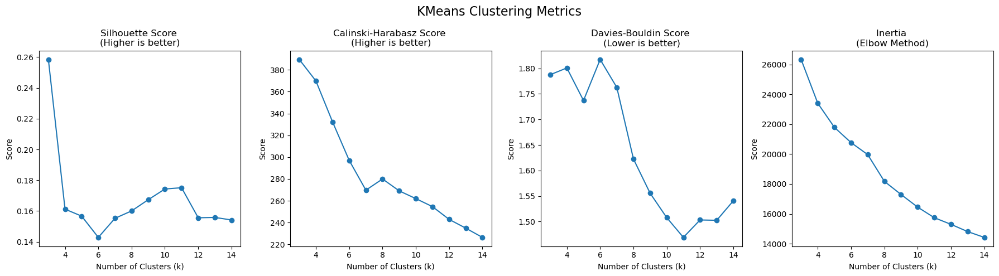

In [9]:
# K-Means - Optimal k search

kmeans_metrics = []

for k in range(3, 15):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels_kmeans = kmeans.fit_predict(X_scaled)

    kmeans_metrics.append({
        'n_clusters': k,
        'silhouette_score': silhouette_score(X_scaled, labels_kmeans),
        'calinski_harabasz': calinski_harabasz_score(X_scaled, labels_kmeans),
        'davies_bouldin': davies_bouldin_score(X_scaled, labels_kmeans),
        'inertia': kmeans.inertia_
    })

# Plot metrics
kmeans_df = pd.DataFrame(kmeans_metrics)
display(kmeans_df)
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle('KMeans Clustering Metrics', fontsize=16)

metrics_to_plot = ['silhouette_score', 'calinski_harabasz', 'davies_bouldin', 'inertia']
titles = ['Silhouette Score \n(Higher is better)', 
          'Calinski-Harabasz Score \n(Higher is better)', 
          'Davies-Bouldin Score \n(Lower is better)', 
          'Inertia \n(Elbow Method)']

for i, metric in enumerate(metrics_to_plot):
    axes[i].plot(kmeans_df['n_clusters'], kmeans_df[metric], marker='o')
    axes[i].set_title(titles[i])
    axes[i].set_xlabel('Number of Clusters (k)')
    axes[i].set_ylabel('Score')

plt.tight_layout()
plt.show()


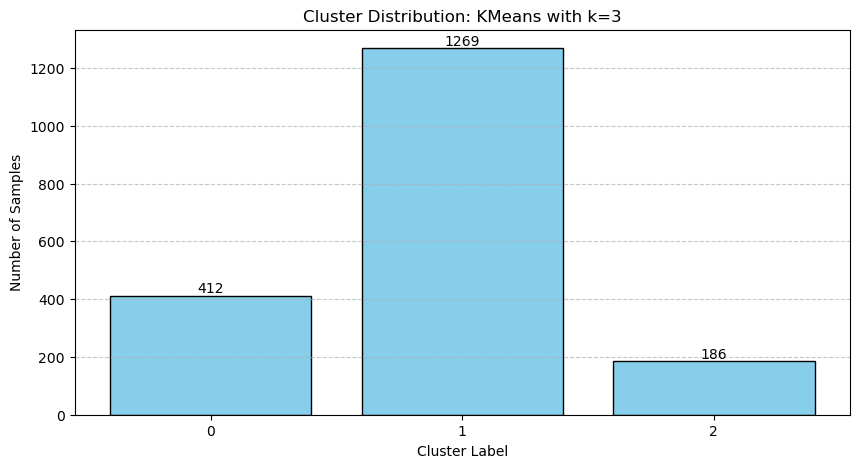

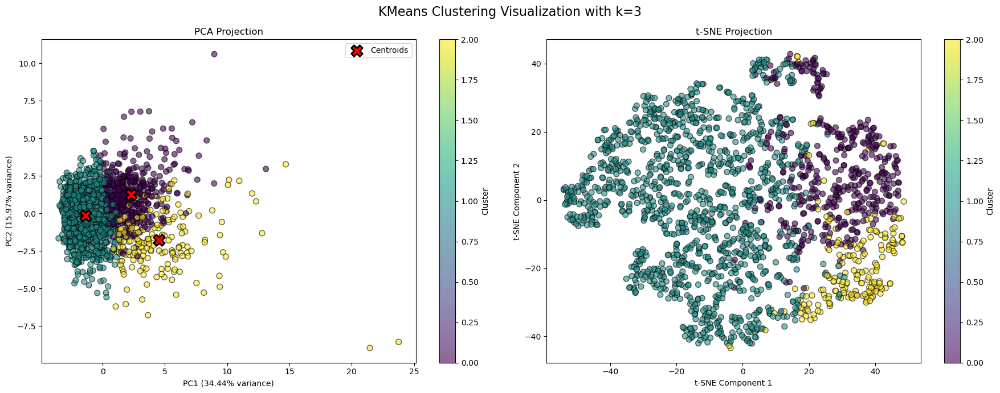

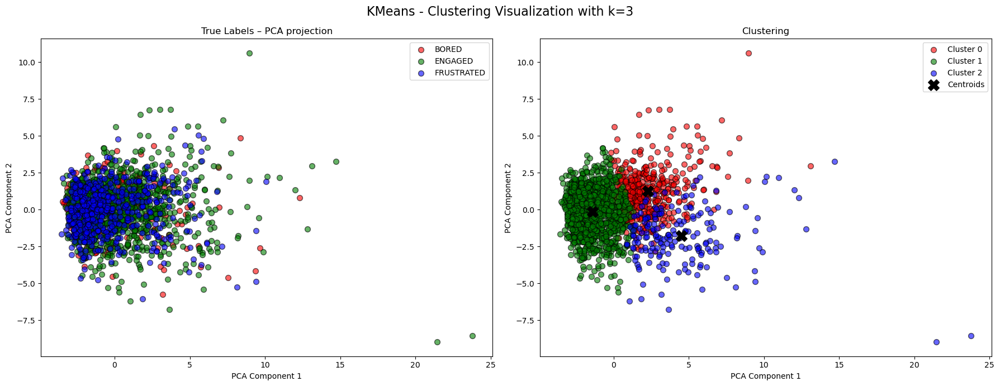

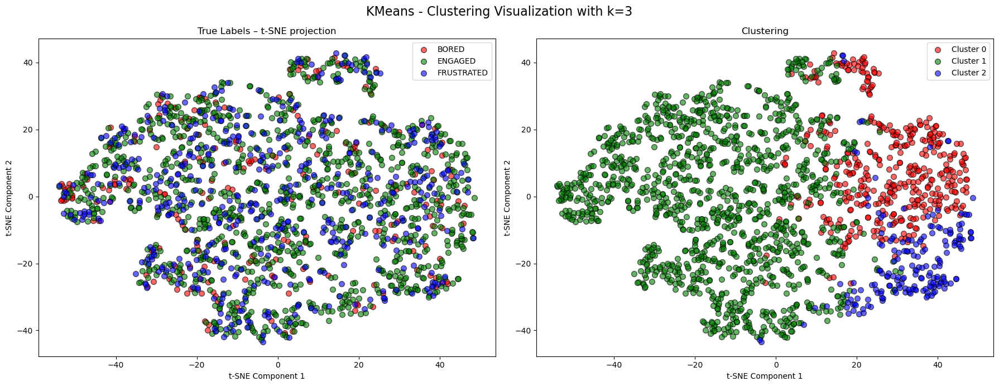

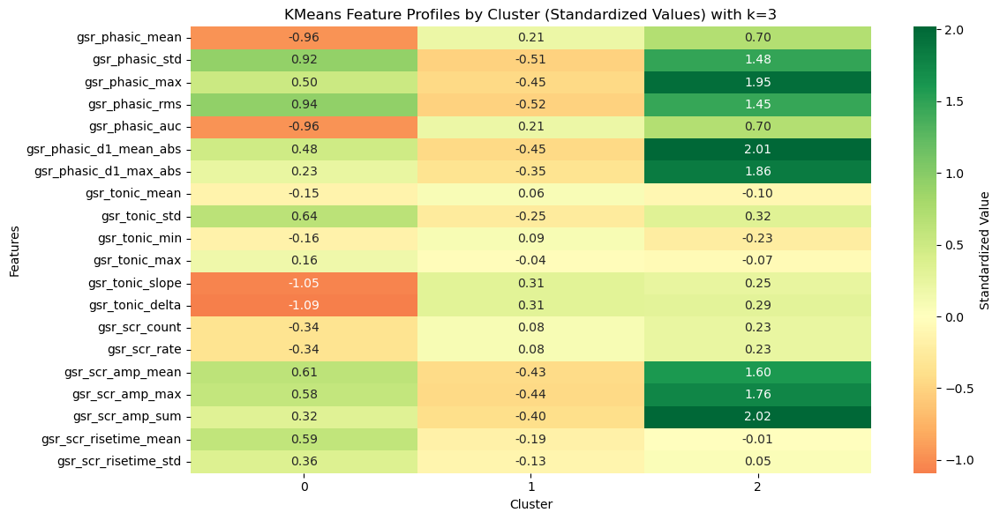

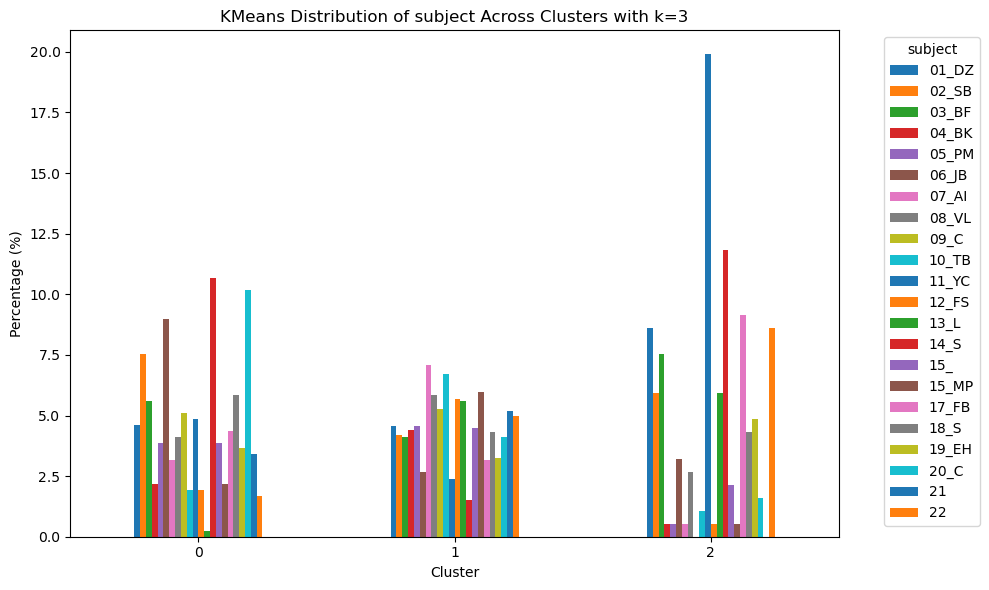


subject Distribution by Cluster (k=3):


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
0,4.61,7.52,5.58,2.18,3.88,8.98,3.16,4.13,5.10,1.94,...,0.24,10.68,3.88,2.18,4.37,5.83,3.64,10.19,3.4,1.70
1,4.57,4.18,4.10,4.41,4.57,2.68,7.09,5.83,5.28,6.70,...,5.59,1.50,4.49,5.99,3.15,4.33,3.23,4.10,5.2,4.96
2,8.60,5.91,7.53,0.54,0.54,3.23,0.54,2.69,0.00,1.08,...,5.91,11.83,2.15,0.54,9.14,4.30,4.84,1.61,0.0,8.60


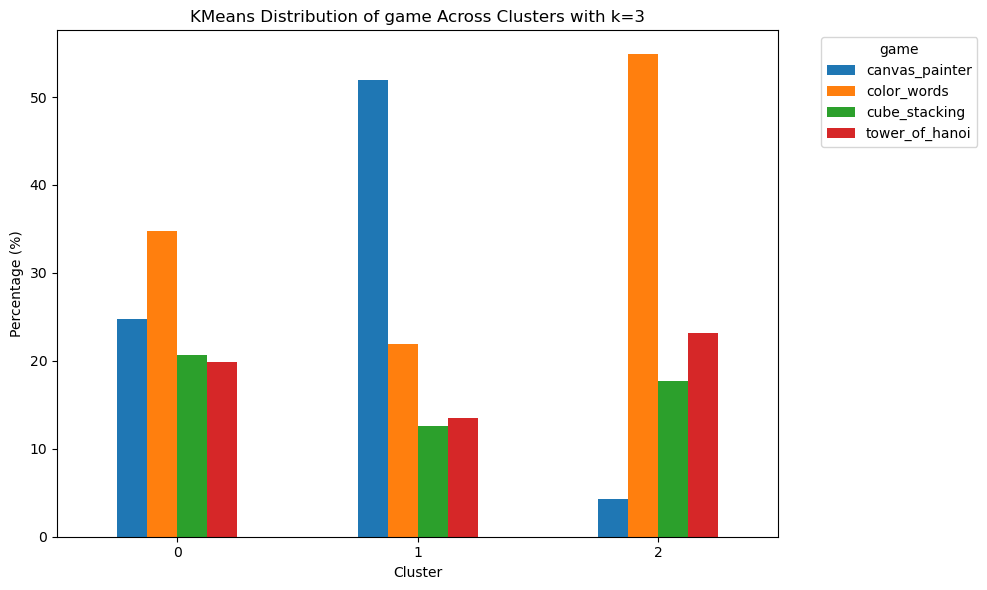


game Distribution by Cluster (k=3):


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
0,24.76,34.71,20.63,19.90
1,51.93,21.91,12.61,13.55
2,4.30,54.84,17.74,23.12


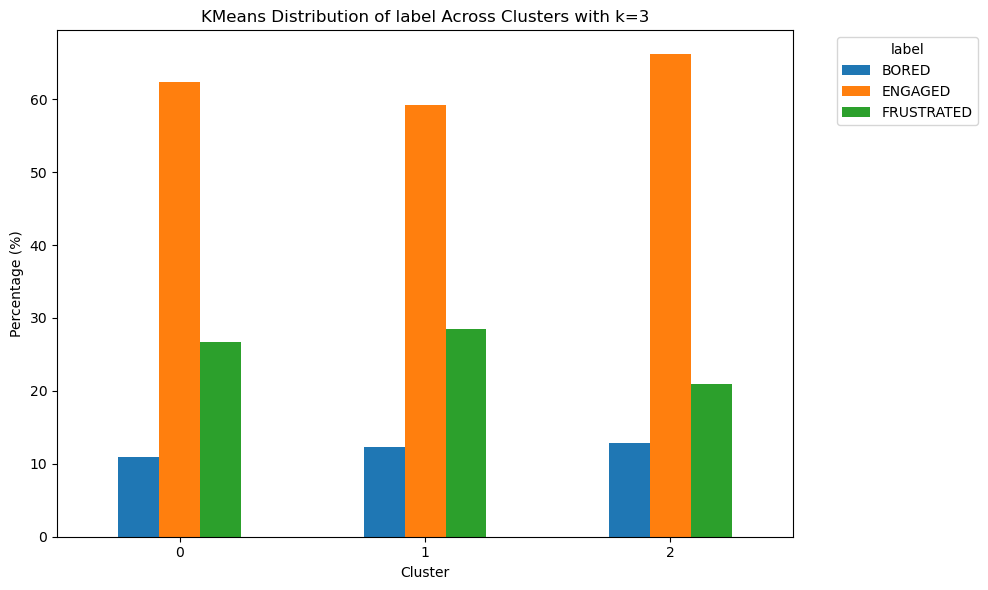


label Distribution by Cluster (k=3):


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
0,10.92,62.38,26.70
1,12.29,59.18,28.53
2,12.90,66.13,20.97


In [20]:
# Visualizing clustering with optimal k
k_optimal = 3
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
labels_kmeans = kmeans.fit_predict(X_scaled)

plot_cluster_distribution(labels_kmeans, 'KMeans', k_value=k_optimal)
plot_clustering(X_scaled, labels_kmeans, name="KMeans", centroids=kmeans.cluster_centers_, k_value=k_optimal)
plot_comparison_clustering_true_labels(X_scaled, labels_kmeans, segments_df['label'], name="KMeans", k_value=k_optimal, centroids=kmeans.cluster_centers_, method="PCA")
plot_comparison_clustering_true_labels(X_scaled, labels_kmeans, segments_df['label'], name="KMeans", k_value=k_optimal, centroids=kmeans.cluster_centers_, method="t-SNE")
plot_cluster_profiles(X_scaled, X_features, labels_kmeans, name='KMeans', k_value=k_optimal)
plot_cluster_characteristics(segments_df, labels_kmeans, name='KMeans', k_value=k_optimal)

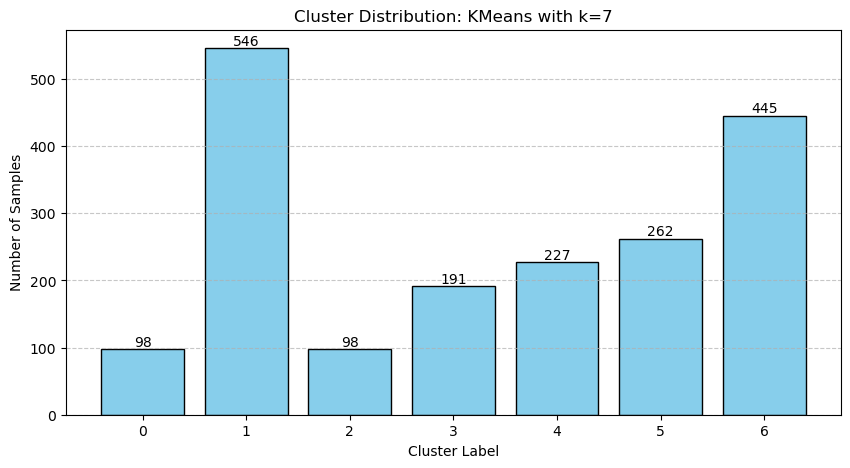

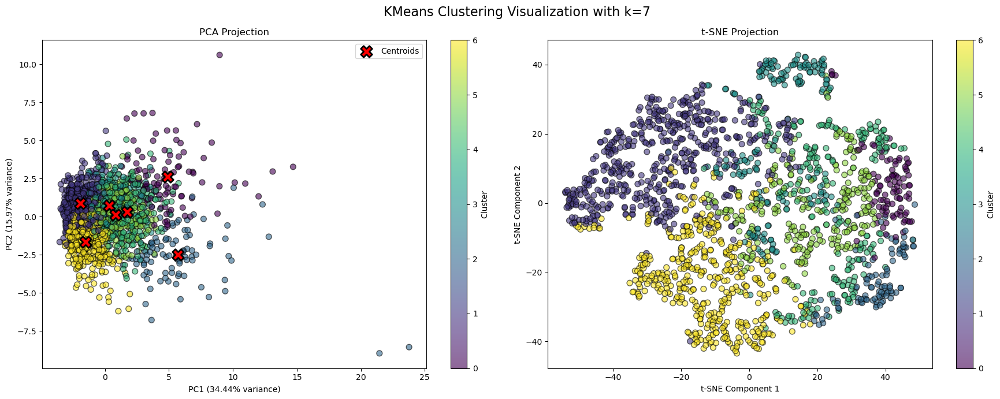

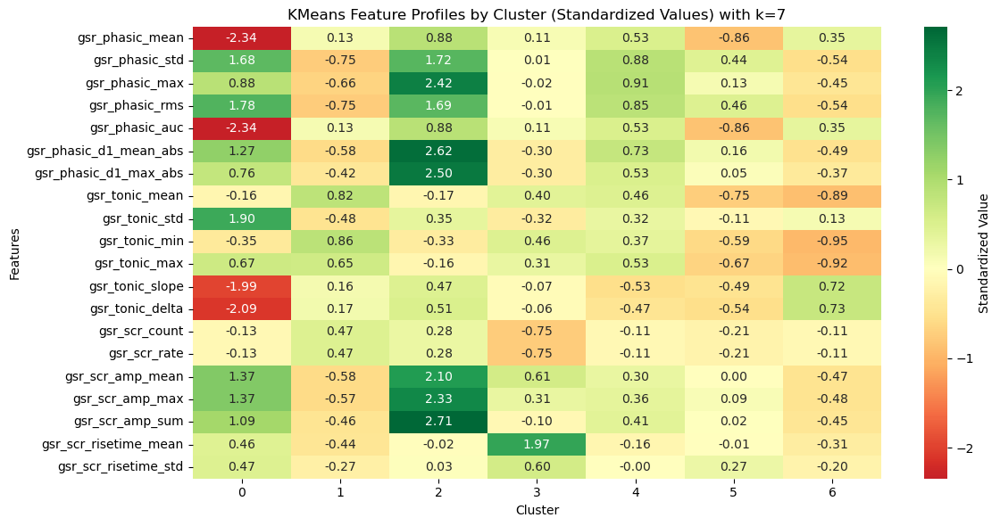

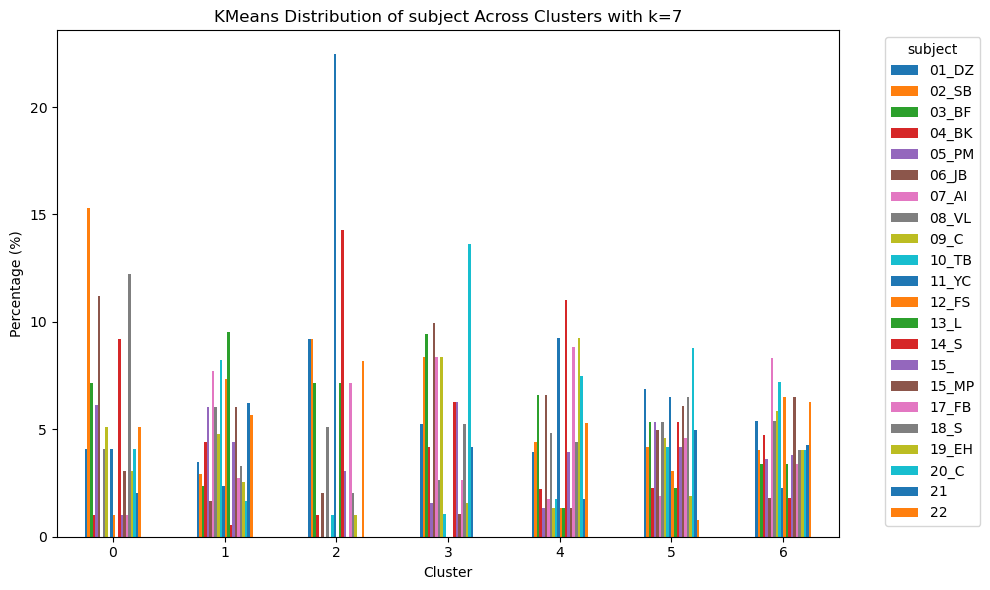


subject Distribution by Cluster (k=7):


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
0,4.08,15.31,7.14,1.02,6.12,11.22,0.00,4.08,5.10,0.00,...,0.00,9.18,1.02,3.06,1.02,12.24,3.06,4.08,2.04,5.10
1,3.48,2.93,2.38,4.40,6.04,1.65,7.69,6.04,4.76,8.24,...,9.52,0.55,4.40,6.04,2.75,3.30,2.56,1.65,6.23,5.68
2,9.18,9.18,7.14,1.02,0.00,2.04,0.00,5.10,0.00,1.02,...,7.14,14.29,3.06,0.00,7.14,2.04,1.02,0.00,0.00,8.16
3,5.24,8.38,9.42,4.19,1.57,9.95,8.38,2.62,8.38,1.05,...,0.00,6.28,6.28,1.05,2.62,5.24,1.57,13.61,4.19,0.00
4,3.96,4.41,6.61,2.20,1.32,6.61,1.76,4.85,1.32,1.76,...,1.32,11.01,3.96,1.32,8.81,4.41,9.25,7.49,1.76,5.29
5,6.87,4.20,5.34,2.29,5.34,4.96,1.91,5.34,4.58,4.20,...,2.29,5.34,4.20,6.11,4.58,6.49,1.91,8.78,4.96,0.76
6,5.39,4.04,3.37,4.72,3.60,1.80,8.31,5.39,5.84,7.19,...,3.37,1.80,3.82,6.52,3.37,4.04,4.04,4.04,4.27,6.29


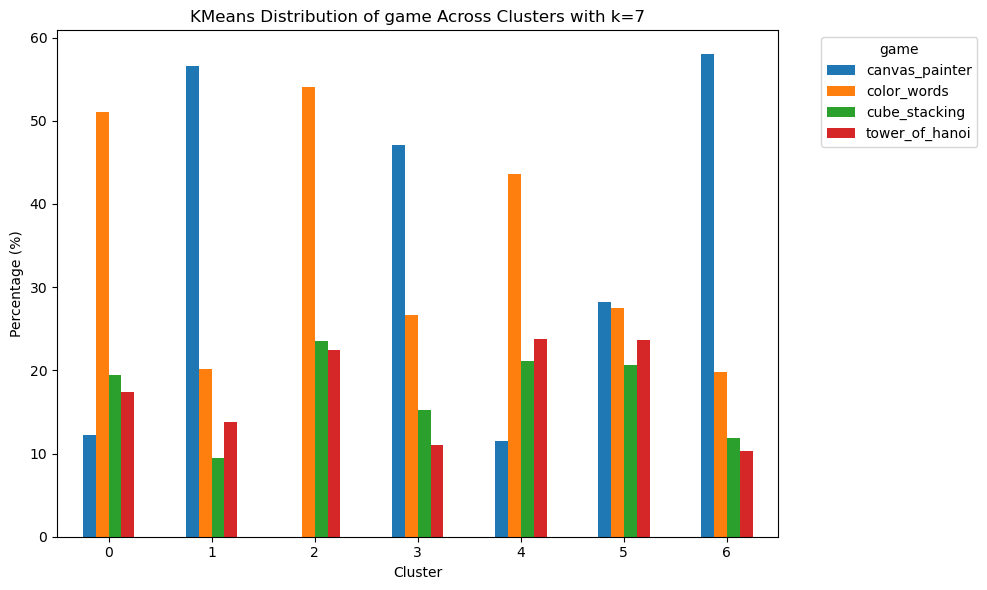


game Distribution by Cluster (k=7):


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
0,12.24,51.02,19.39,17.35
1,56.59,20.15,9.52,13.74
2,0.00,54.08,23.47,22.45
3,47.12,26.70,15.18,10.99
4,11.45,43.61,21.15,23.79
5,28.24,27.48,20.61,23.66
6,57.98,19.78,11.91,10.34


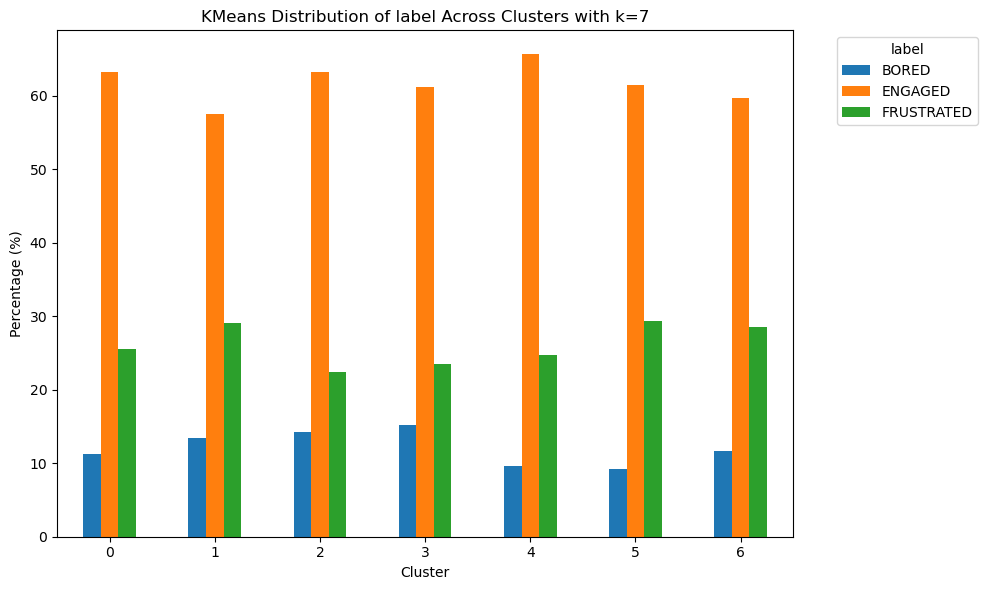


label Distribution by Cluster (k=7):


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
0,11.22,63.27,25.51
1,13.37,57.51,29.12
2,14.29,63.27,22.45
3,15.18,61.26,23.56
4,9.69,65.64,24.67
5,9.16,61.45,29.39
6,11.69,59.78,28.54


In [31]:
# Visualizing clustering with optimal k
k_optimal = 7
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
labels_kmeans = kmeans.fit_predict(X_scaled)

plot_cluster_distribution(labels_kmeans, 'KMeans', k_value=k_optimal)
plot_clustering(X_scaled, labels_kmeans, name="KMeans", centroids=kmeans.cluster_centers_, k_value=k_optimal)
plot_cluster_profiles(X_scaled, X_features, labels_kmeans, name='KMeans', k_value=k_optimal)
plot_cluster_characteristics(segments_df, labels_kmeans, name='KMeans', k_value=k_optimal)

## K-Medoids

,n_clusters,silhouette_score,calinski_harabasz,davies_bouldin,inertia
0,3,0.117297,349.784095,1.684377,6478.386493
1,4,0.105570,290.203903,1.557606,6231.476628
2,5,0.097273,246.794805,1.639156,6108.676863
3,6,0.053168,207.267151,1.614381,6037.365154
4,7,0.069343,224.169900,1.696961,5791.404294
5,8,0.055435,205.663607,1.790727,5666.946874
6,9,0.059744,199.559060,1.765009,5503.789703
7,10,0.051085,171.517003,1.798124,5496.474019
8,11,0.040810,175.830933,1.839671,5411.014515
9,12,0.036514,164.174646,1.818029,5393.732962


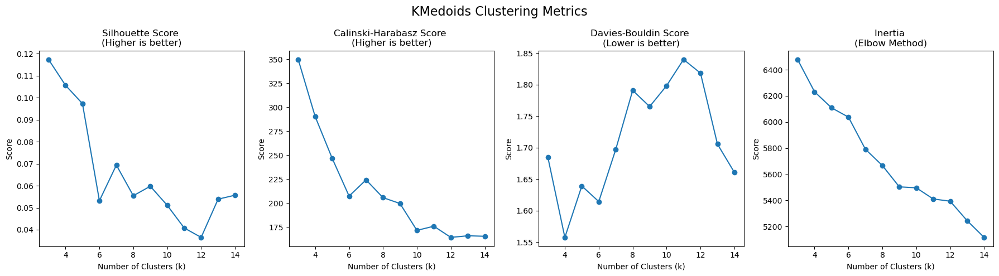

In [18]:
# K-Medoids - Optimal k search

kmedoids_metrics = []

for k in range(3, 15):
    kmedoids = KMedoids(n_clusters=k, metric="euclidean", random_state=42)
    labels_kmedoids = kmedoids.fit_predict(X_scaled)

    kmedoids_metrics.append({
        "n_clusters": k,
        "silhouette_score": silhouette_score(X_scaled, labels_kmedoids),
        "calinski_harabasz": calinski_harabasz_score(X_scaled, labels_kmedoids),
        "davies_bouldin": davies_bouldin_score(X_scaled, labels_kmedoids),
        "inertia": kmedoids.inertia_
    })

# Plot metrics
kmedoids_df = pd.DataFrame(kmedoids_metrics)
display(kmedoids_df)
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle('KMedoids Clustering Metrics', fontsize=16)

metrics_to_plot = ['silhouette_score', 'calinski_harabasz', 'davies_bouldin', 'inertia']
titles = ['Silhouette Score \n(Higher is better)', 
          'Calinski-Harabasz Score \n(Higher is better)', 
          'Davies-Bouldin Score \n(Lower is better)', 
          'Inertia \n(Elbow Method)']

for i, metric in enumerate(metrics_to_plot):
    axes[i].plot(kmedoids_df['n_clusters'], kmedoids_df[metric], marker='o')
    axes[i].set_title(titles[i])
    axes[i].set_xlabel('Number of Clusters (k)')
    axes[i].set_ylabel('Score')

plt.tight_layout()
plt.show()


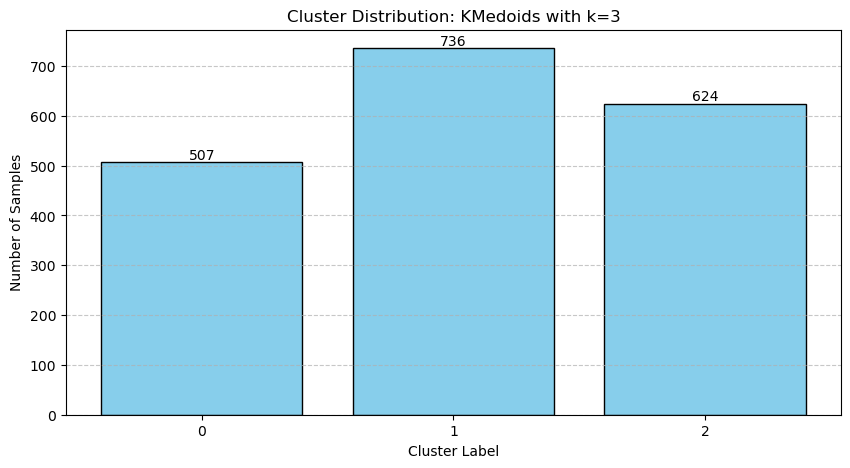

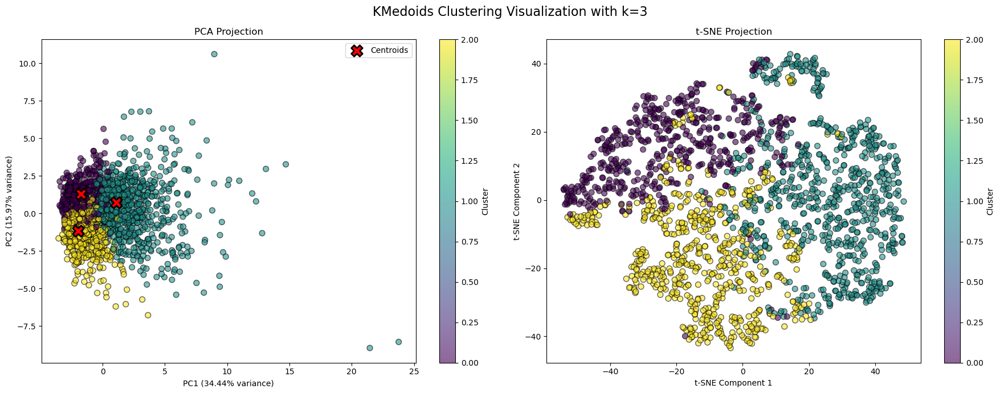

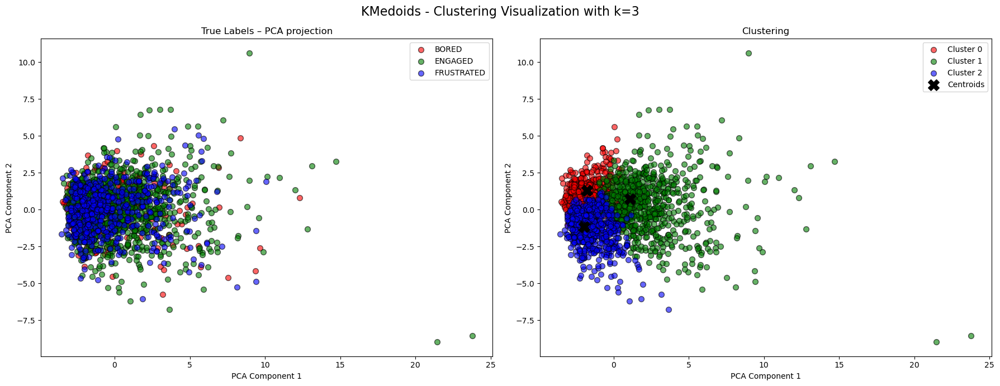

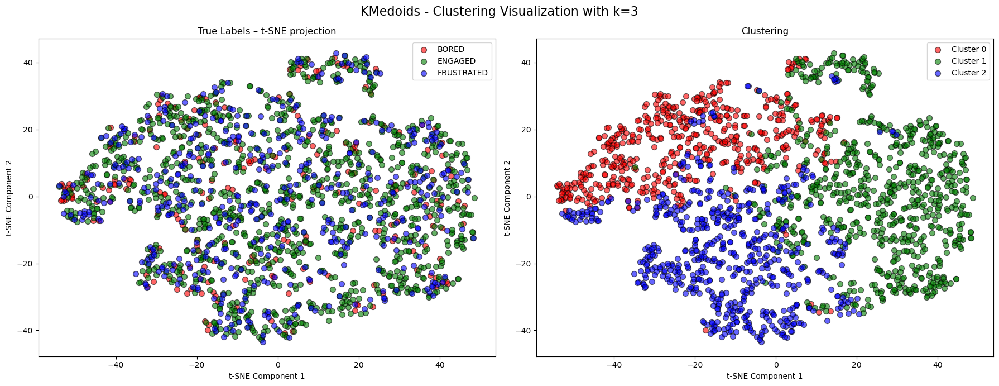

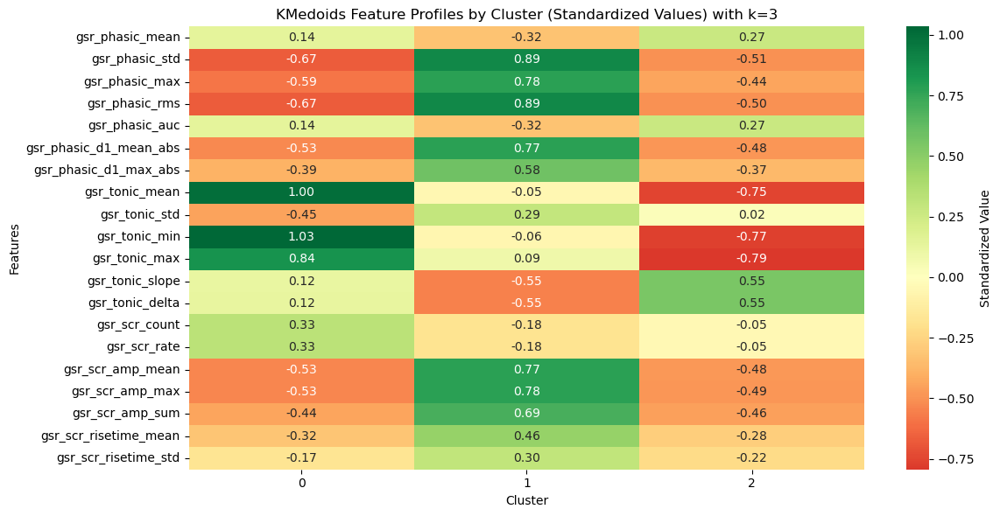

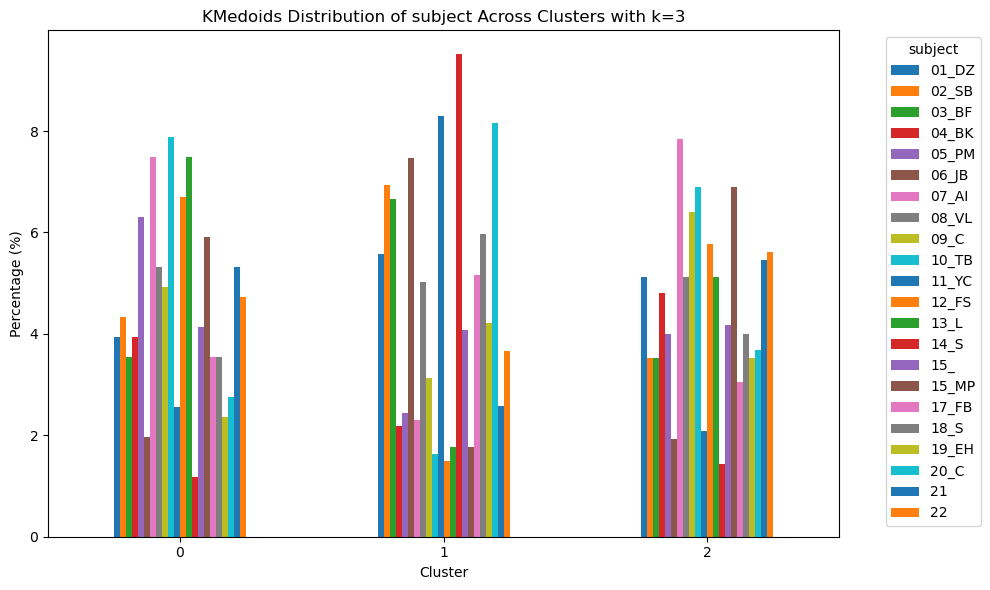


subject Distribution by Cluster (k=3):


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
0,3.94,4.34,3.55,3.94,6.31,1.97,7.50,5.33,4.93,7.89,...,7.50,1.18,4.14,5.92,3.55,3.55,2.37,2.76,5.33,4.73
1,5.57,6.93,6.66,2.17,2.45,7.47,2.31,5.03,3.12,1.63,...,1.77,9.51,4.08,1.77,5.16,5.98,4.21,8.15,2.58,3.67
2,5.13,3.53,3.53,4.81,4.01,1.92,7.85,5.13,6.41,6.89,...,5.13,1.44,4.17,6.89,3.04,4.01,3.53,3.69,5.45,5.61


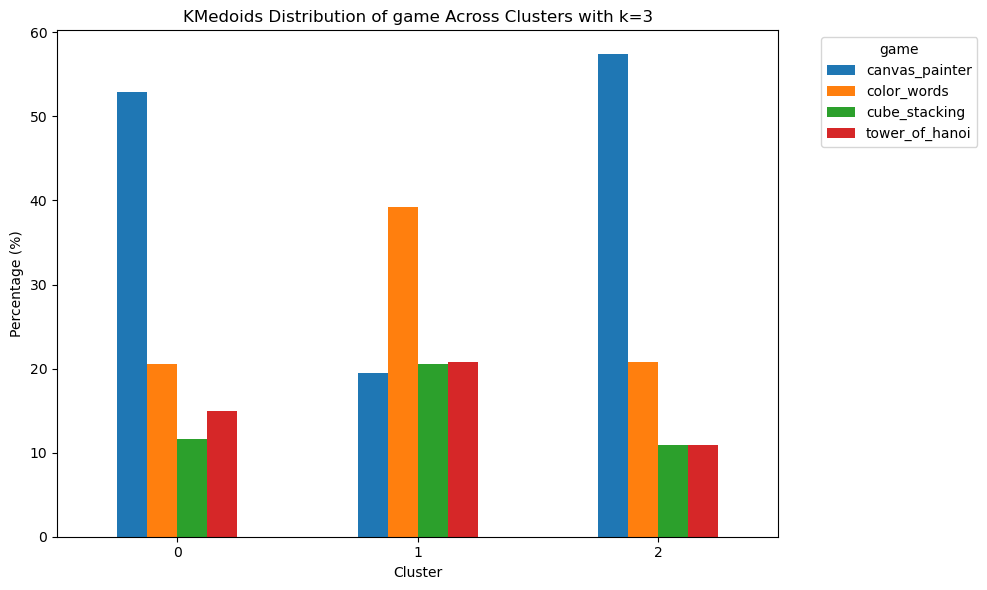


game Distribution by Cluster (k=3):


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
0,52.86,20.51,11.64,14.99
1,19.43,39.27,20.52,20.79
2,57.37,20.83,10.90,10.90


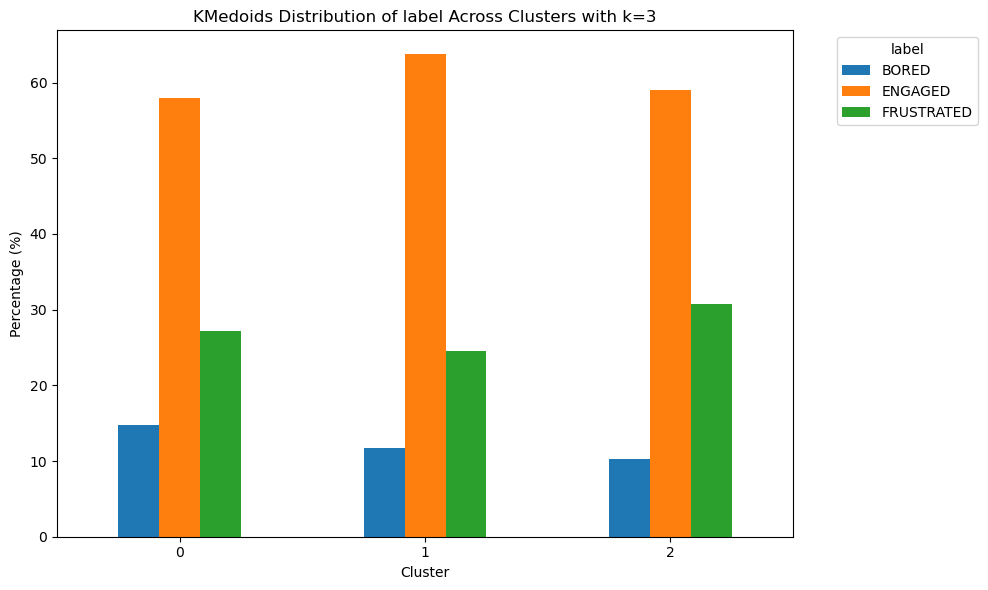


label Distribution by Cluster (k=3):


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
0,14.79,57.99,27.22
1,11.68,63.72,24.59
2,10.26,58.97,30.77


In [19]:
# Visualizing clustering with optimal k

k_optimal = 3
kmedoids = KMedoids(n_clusters=k_optimal, metric="euclidean", random_state=42)
labels_kmedoids = kmedoids.fit_predict(X_scaled)

plot_cluster_distribution(labels_kmedoids, 'KMedoids', k_value=k_optimal)
plot_clustering(X_scaled, labels_kmedoids, name="KMedoids", centroids=kmedoids.cluster_centers_, k_value=k_optimal)
plot_comparison_clustering_true_labels(X_scaled, labels_kmedoids, segments_df['label'], name="KMedoids", k_value=k_optimal, centroids=kmedoids.cluster_centers_, method="PCA")
plot_comparison_clustering_true_labels(X_scaled, labels_kmedoids, segments_df['label'], name="KMedoids", k_value=k_optimal, centroids=kmedoids.cluster_centers_, method="t-SNE")
plot_cluster_profiles(X_scaled, X_features, labels_kmedoids, name='KMedoids', k_value=k_optimal)
plot_cluster_characteristics(segments_df, labels_kmedoids, name='KMedoids', k_value=k_optimal)

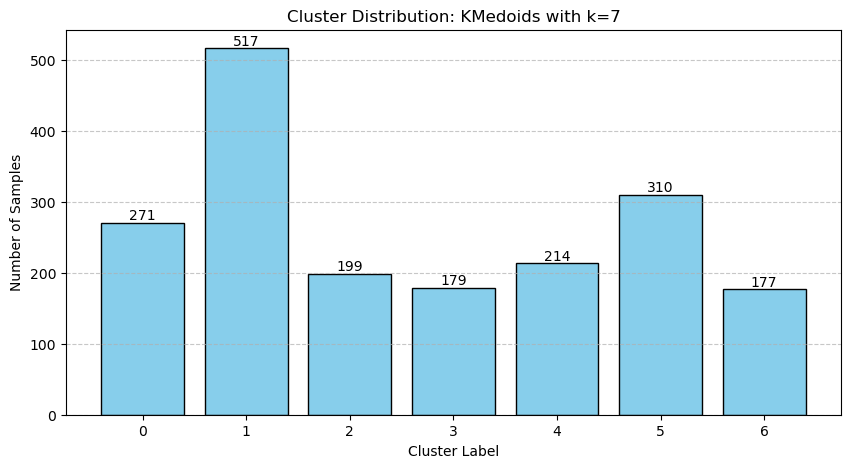

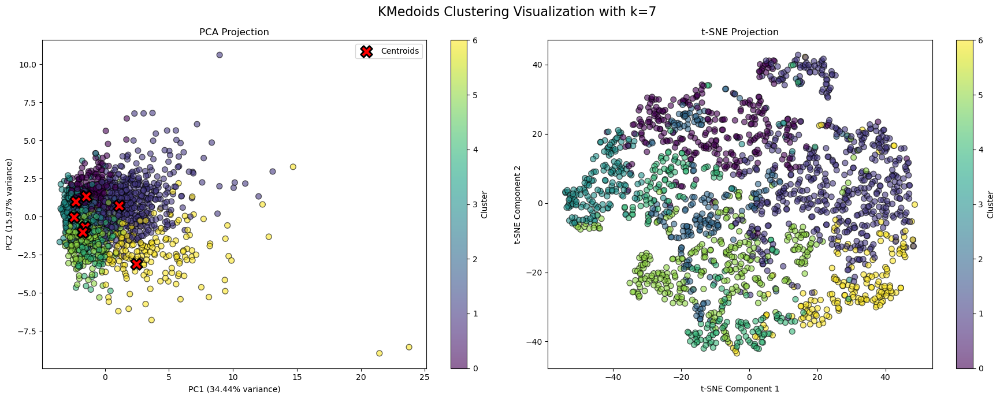

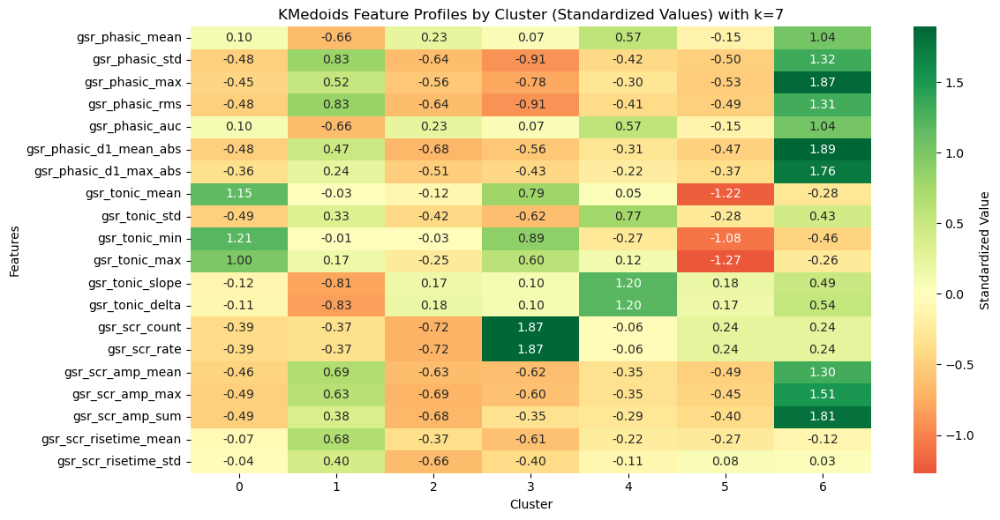

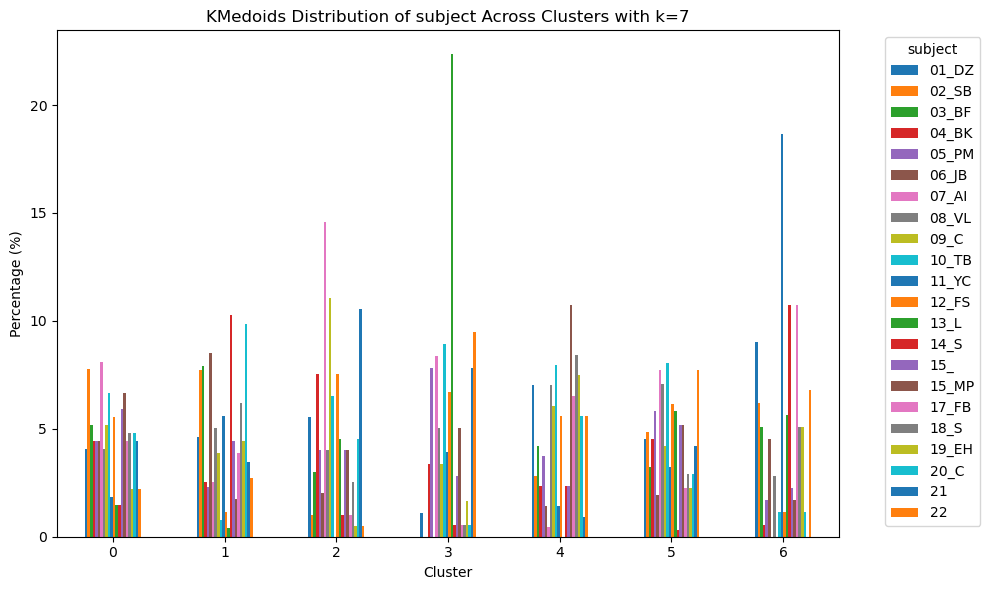


subject Distribution by Cluster (k=7):


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
0,4.06,7.75,5.17,4.43,4.43,4.43,8.12,4.06,5.17,6.64,...,1.48,1.48,5.90,6.64,4.43,4.80,2.21,4.80,4.43,2.21
1,4.64,7.74,7.93,2.51,2.32,8.51,2.51,5.03,3.87,0.77,...,0.39,10.25,4.45,1.74,3.87,6.19,4.45,9.86,3.48,2.71
2,5.53,1.01,3.02,7.54,4.02,2.01,14.57,4.02,11.06,6.53,...,4.52,1.01,4.02,4.02,1.01,2.51,0.50,4.52,10.55,0.50
3,1.12,0.00,0.00,3.35,7.82,0.00,8.38,5.03,3.35,8.94,...,22.35,0.56,2.79,5.03,0.56,0.56,1.68,0.56,7.82,9.50
4,7.01,2.80,4.21,2.34,3.74,1.40,0.47,7.01,6.07,7.94,...,0.00,2.34,2.34,10.75,6.54,8.41,7.48,5.61,0.93,5.61
5,4.52,4.84,3.23,4.52,5.81,1.94,7.74,7.10,4.19,8.06,...,5.81,0.32,5.16,5.16,2.26,2.90,2.26,2.90,4.19,7.74
6,9.04,6.21,5.08,0.56,1.69,4.52,0.00,2.82,0.00,1.13,...,5.65,10.73,2.26,1.69,10.73,5.08,5.08,1.13,0.00,6.78


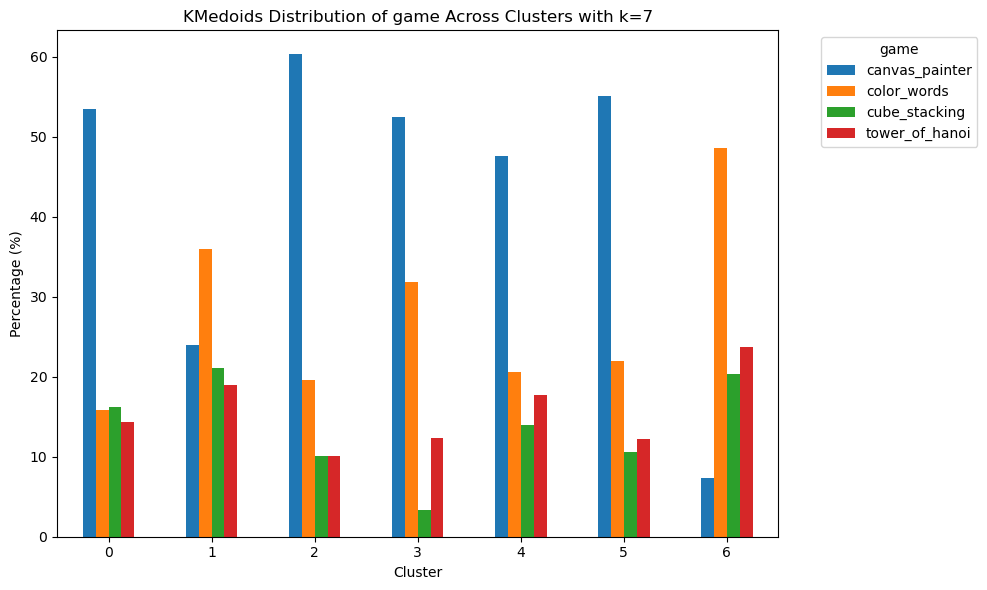


game Distribution by Cluster (k=7):


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
0,53.51,15.87,16.24,14.39
1,23.98,35.98,21.08,18.96
2,60.30,19.60,10.05,10.05
3,52.51,31.84,3.35,12.29
4,47.66,20.56,14.02,17.76
5,55.16,21.94,10.65,12.26
6,7.34,48.59,20.34,23.73


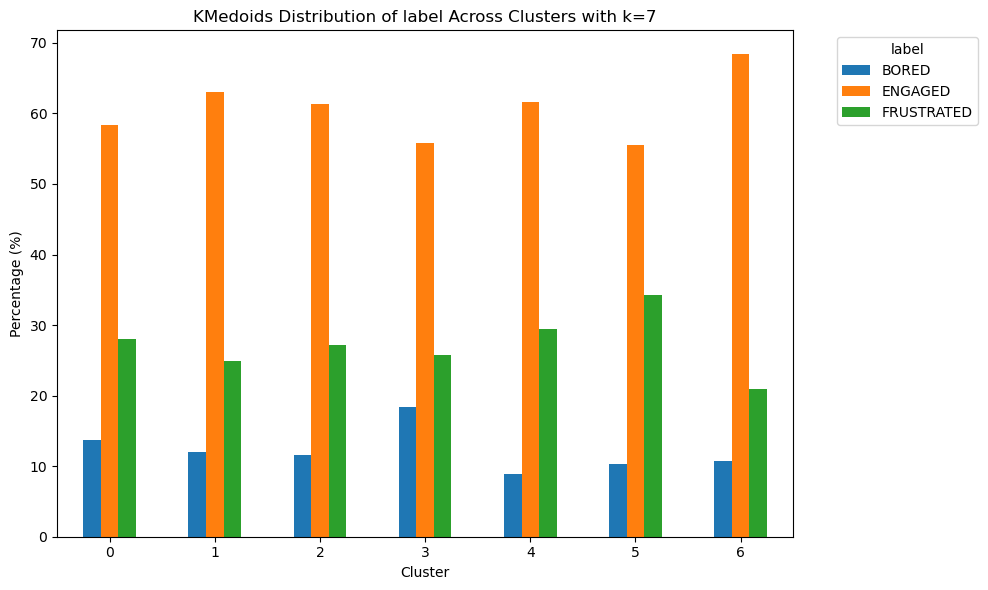


label Distribution by Cluster (k=7):


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
0,13.65,58.30,28.04
1,11.99,63.06,24.95
2,11.56,61.31,27.14
3,18.44,55.87,25.70
4,8.88,61.68,29.44
5,10.32,55.48,34.19
6,10.73,68.36,20.90


In [32]:
# Visualizing clustering with optimal k

k_optimal = 7
kmedoids = KMedoids(n_clusters=k_optimal, metric="euclidean", random_state=42)
labels_kmedoids = kmedoids.fit_predict(X_scaled)

plot_cluster_distribution(labels_kmedoids, 'KMedoids', k_value=k_optimal)
plot_clustering(X_scaled, labels_kmedoids, name="KMedoids", centroids=kmedoids.cluster_centers_, k_value=k_optimal)
plot_cluster_profiles(X_scaled, X_features, labels_kmedoids, name='KMedoids', k_value=k_optimal)
plot_cluster_characteristics(segments_df, labels_kmedoids, name='KMedoids', k_value=k_optimal)

## DBSCAN

,eps,min_samples,n_clusters,n_noise,silhouette_score,calinski_habraz_score,davies_bouldin_score
0,0.5,5,1,1861,NaN,NaN,NaN
1,0.5,10,0,1867,NaN,NaN,NaN
2,0.5,15,0,1867,NaN,NaN,NaN
3,0.5,20,0,1867,NaN,NaN,NaN
4,1.0,5,4,1398,-0.249796,50.405902,1.947239
5,1.0,10,2,1580,-0.113543,58.739976,1.757873
6,1.0,15,2,1724,-0.213136,32.544388,1.743584
7,1.0,20,1,1847,NaN,NaN,NaN
8,1.5,5,2,832,0.016267,197.262505,1.926034
9,1.5,10,2,984,-0.080724,174.771936,2.322178


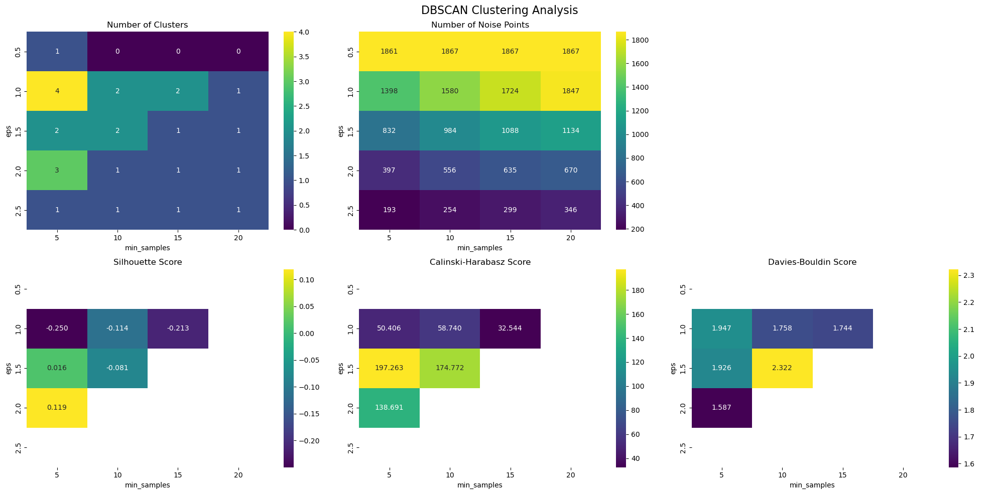

In [12]:
# DBSCAN - Optimal parameter search

eps_range = [0.5, 1.0, 1.5, 2.0, 2.5]
min_samples_range = [5, 10, 15, 20]

results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)
        
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        
        if n_clusters > 1:
            silhouette = silhouette_score(X_scaled, labels)
            calinski_habraz = calinski_harabasz_score(X_scaled, labels)
            davies_bouldin = davies_bouldin_score(X_scaled, labels)
        else:
            silhouette, calinski_habraz, davies_bouldin = np.nan, np.nan, np.nan
            
        results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'silhouette_score': silhouette,
            'calinski_habraz_score': calinski_habraz,
            'davies_bouldin_score': davies_bouldin
        })

dbscan_df = pd.DataFrame(results)
display(dbscan_df)

fig, axes = plt.subplots(2, 3, figsize=(20, 10))
fig.suptitle('DBSCAN Clustering Analysis', fontsize=16)

# Row 1: Cluster counts and noise
counts = [('n_clusters', 'Number of Clusters'), ('n_noise', 'Number of Noise Points')]
for i, (col, title) in enumerate(counts):
    pivot_table = dbscan_df.pivot(index='eps', columns='min_samples', values=col)
    sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap='viridis', ax=axes[0, i])
    axes[0, i].set_title(title)
axes[0, 2].axis('off')

# Row 2: Evaluation metrics
metrics = [
    ('silhouette_score', 'Silhouette Score'),
    ('calinski_habraz_score', 'Calinski-Harabasz Score'),
    ('davies_bouldin_score', 'Davies-Bouldin Score')
]
for i, (col, title) in enumerate(metrics):
    pivot_table = dbscan_df.pivot(index='eps', columns='min_samples', values=col)
    sns.heatmap(pivot_table, annot=True, fmt=".3f", cmap='viridis', ax=axes[1, i])
    axes[1, i].set_title(title)

plt.tight_layout()
plt.show()


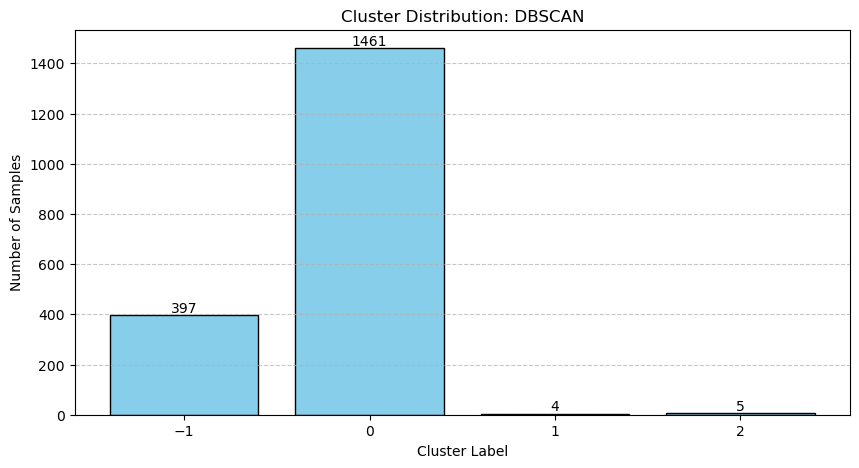

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


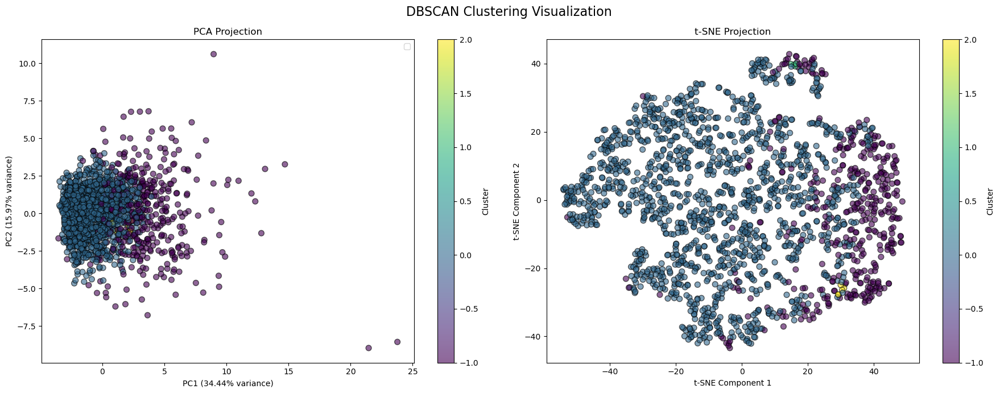

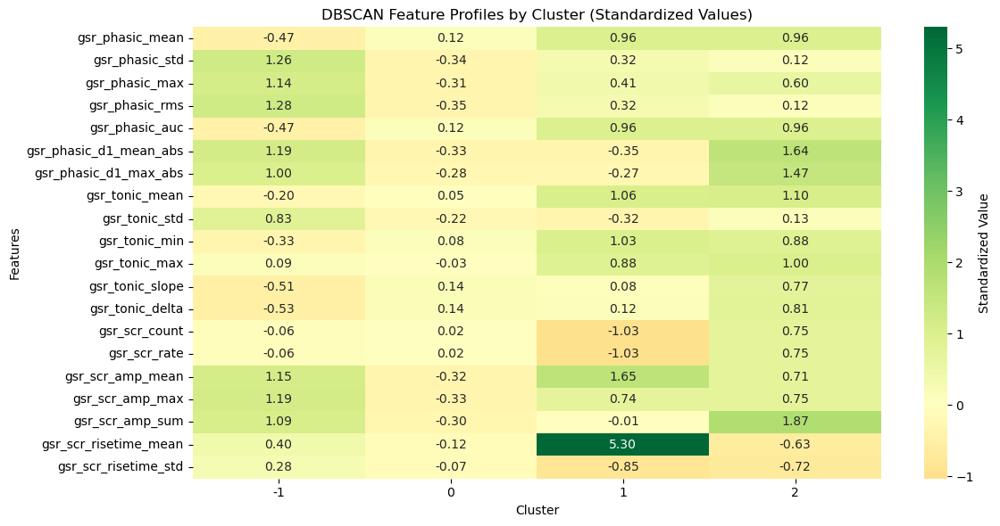

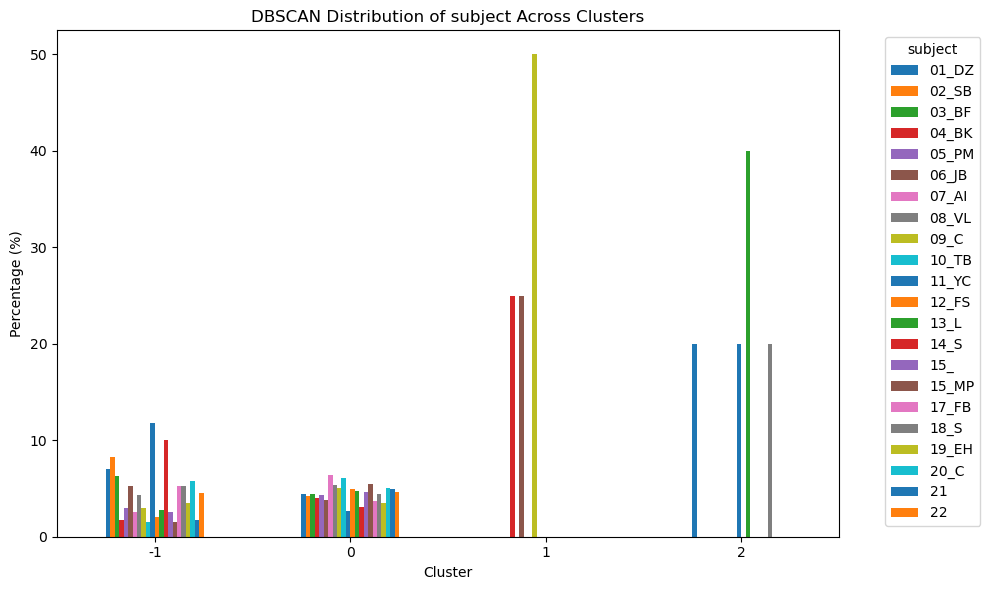


subject Distribution by Cluster:


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
-1,7.05,8.31,6.30,1.76,3.02,5.29,2.52,4.28,3.02,1.51,...,2.77,10.08,2.52,1.51,5.29,5.29,3.53,5.79,1.76,4.53
0,4.38,4.24,4.38,3.97,4.31,3.76,6.43,5.41,5.07,6.09,...,4.79,3.08,4.59,5.48,3.70,4.45,3.49,5.07,5.00,4.65
1,0.00,0.00,0.00,25.00,0.00,25.00,0.00,0.00,50.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,20.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,40.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00,0.00


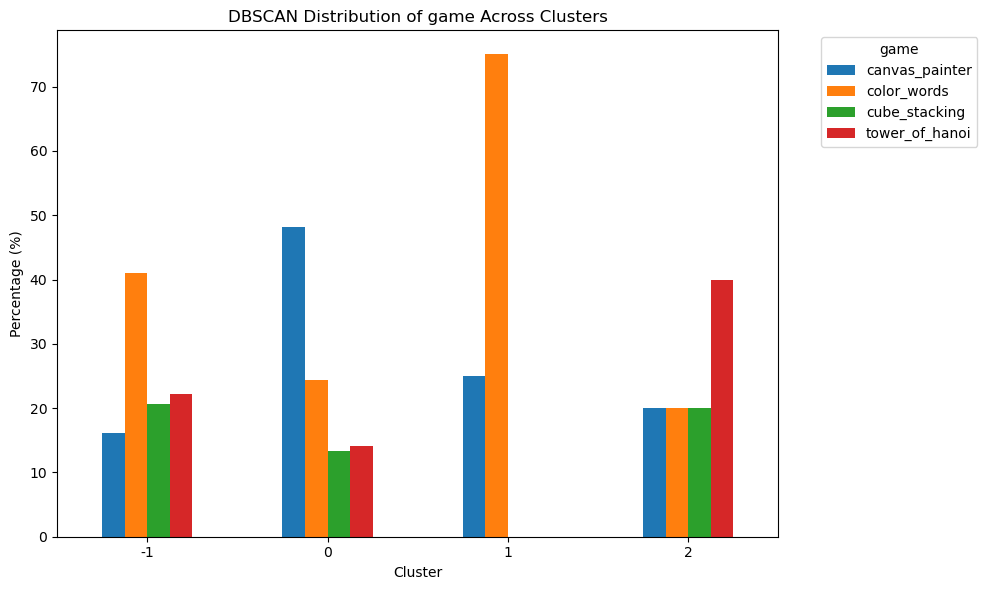


game Distribution by Cluster:


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
-1,16.12,41.06,20.65,22.17
0,48.12,24.37,13.35,14.17
1,25.00,75.00,0.00,0.00
2,20.00,20.00,20.00,40.00


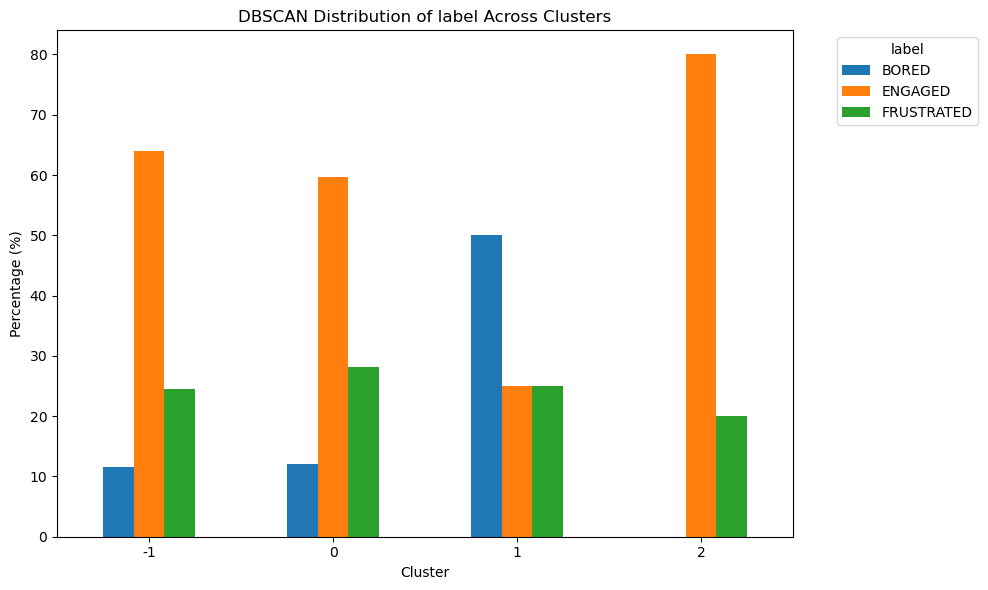


label Distribution by Cluster:


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
-1,11.59,63.98,24.43
0,12.11,59.69,28.20
1,50.00,25.00,25.00
2,0.00,80.00,20.00


In [13]:
# Cluster analysis of DBSCAN

dbscan = DBSCAN(eps=2.0, min_samples=5)
labels_dbscan = dbscan.fit_predict(X_scaled)

plot_cluster_distribution(labels_dbscan, 'DBSCAN')
plot_clustering(X_scaled, labels_dbscan, name="DBSCAN")
plot_cluster_profiles(X_scaled, X_features, labels_dbscan, name='DBSCAN')
plot_cluster_characteristics(segments_df, labels_dbscan, name='DBSCAN')

## HDBSCAN

,min_clusters,n_clusters,n_noise,silhouette_score,calinski_habraz_score,davies_bouldin_score
0,5,2,656,0.081512,202.474161,1.868244
1,10,2,1843,-0.232575,6.084168,1.532922
2,15,0,1867,NaN,NaN,NaN
3,20,0,1867,NaN,NaN,NaN
4,25,0,1867,NaN,NaN,NaN
5,30,0,1867,NaN,NaN,NaN
6,50,0,1867,NaN,NaN,NaN


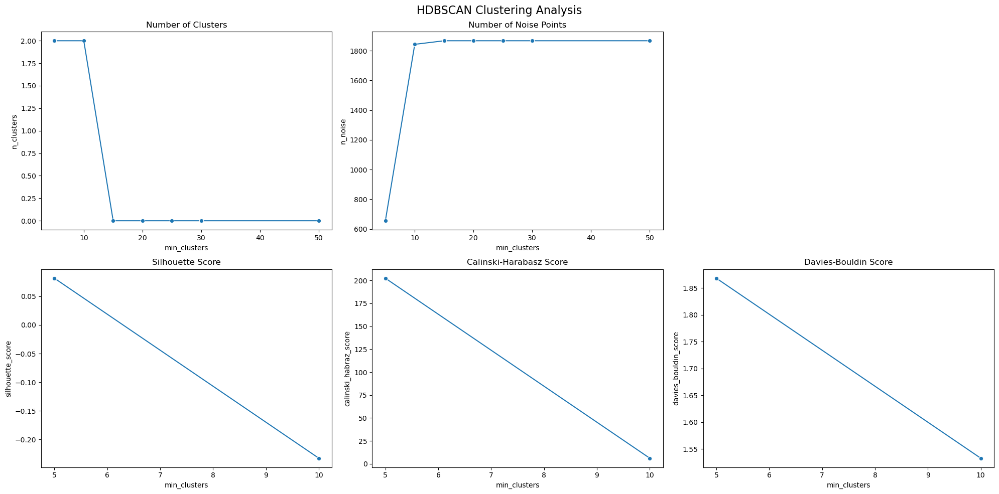

In [14]:
# HDBSCAN - Optimal parameter search

min_clusters_range = [5, 10, 15, 20, 25, 30, 50]

results = []

for min_clusters in min_clusters_range:
    hdbscan_model = HDBSCAN(min_cluster_size=min_clusters)
    labels = hdbscan_model.fit_predict(X_scaled)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    
    if n_clusters > 1:
        silhouette = silhouette_score(X_scaled, labels)
        calinski_habraz = calinski_harabasz_score(X_scaled, labels)
        davies_bouldin = davies_bouldin_score(X_scaled, labels)
    else:
        silhouette, calinski_habraz, davies_bouldin = np.nan, np.nan, np.nan
        
    results.append({
        'min_clusters': min_clusters,
        'n_clusters': n_clusters,
        'n_noise': n_noise,
        'silhouette_score': silhouette,
        'calinski_habraz_score': calinski_habraz,
        'davies_bouldin_score': davies_bouldin
    })

hdbscan_df = pd.DataFrame(results)
display(hdbscan_df)

fig, axes = plt.subplots(2, 3, figsize=(20, 10))
fig.suptitle('HDBSCAN Clustering Analysis', fontsize=16)

# Row 1: Cluster counts and noise
counts = [('n_clusters', 'Number of Clusters'), ('n_noise', 'Number of Noise Points')]
for i, (col, title) in enumerate(counts):
    sns.lineplot(data=hdbscan_df, x='min_clusters', y=col, marker='o', ax=axes[0, i])
    axes[0, i].set_title(title)
axes[0, 2].axis('off')

# Row 2: Evaluation metrics
metrics = [
    ('silhouette_score', 'Silhouette Score'),
    ('calinski_habraz_score', 'Calinski-Harabasz Score'),
    ('davies_bouldin_score', 'Davies-Bouldin Score')
]
for i, (col, title) in enumerate(metrics):
    sns.lineplot(data=hdbscan_df, x='min_clusters', y=col, marker='o', ax=axes[1, i])
    axes[1, i].set_title(title)

plt.tight_layout()
plt.show()

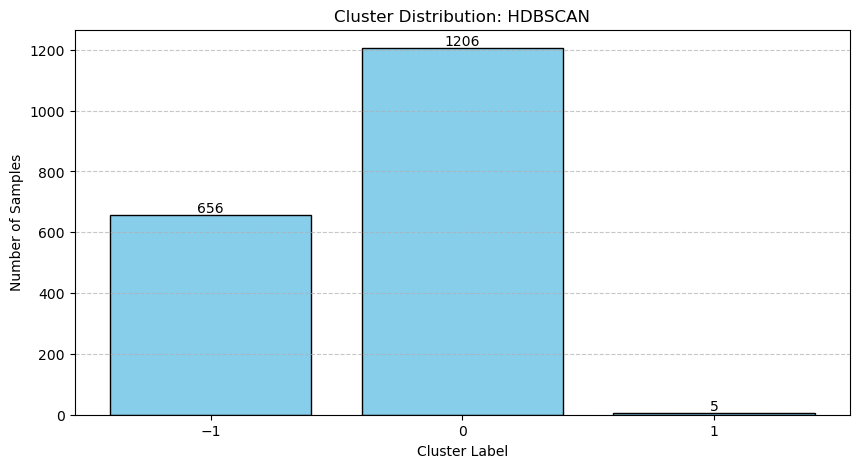

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


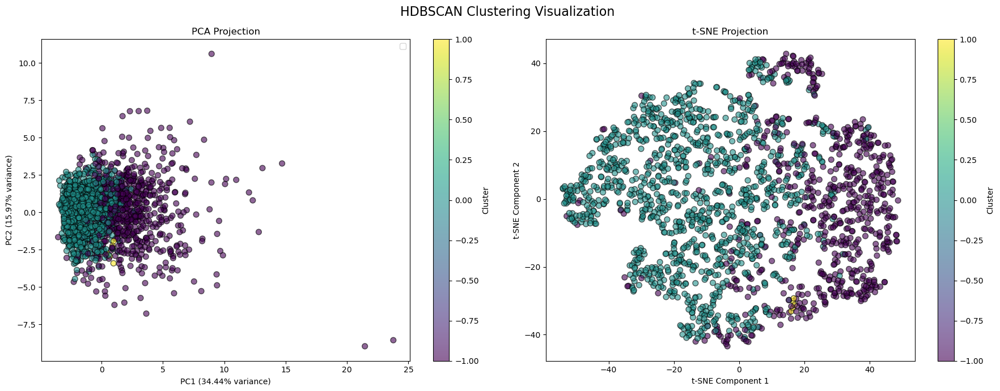

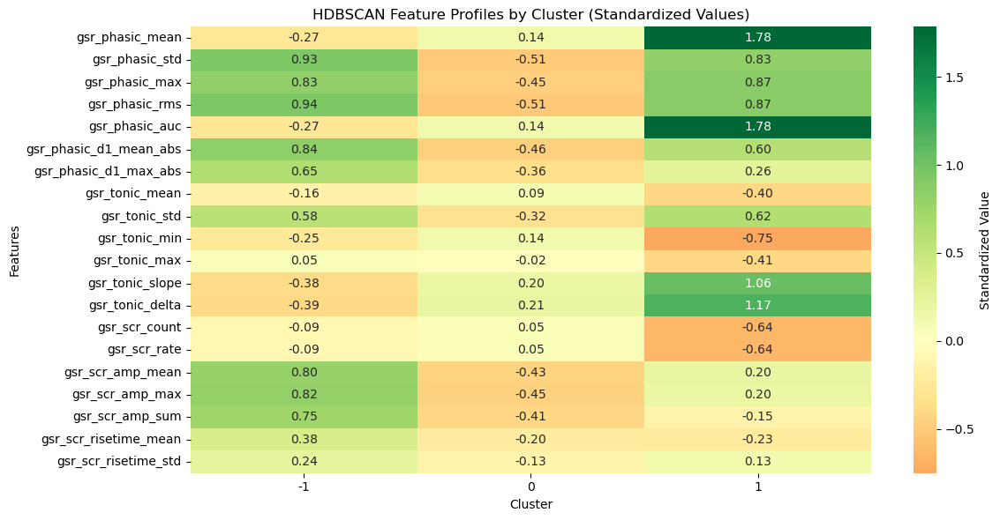

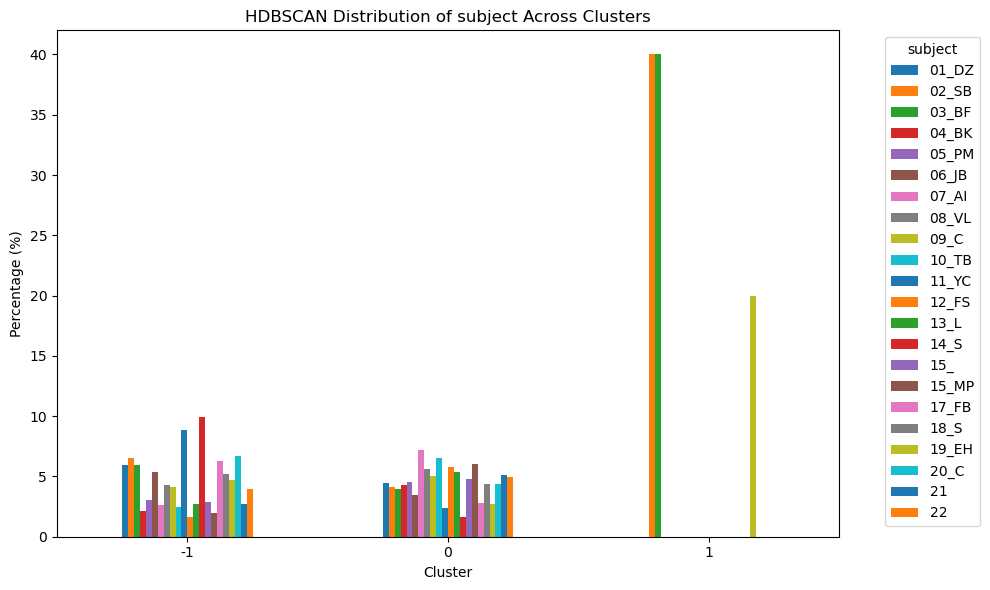


subject Distribution by Cluster:


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
-1,5.95,6.55,5.95,2.13,3.05,5.34,2.59,4.27,4.12,2.44,...,2.74,9.91,2.90,1.98,6.25,5.18,4.73,6.71,2.74,3.96
0,4.48,4.15,3.98,4.31,4.56,3.48,7.21,5.64,5.06,6.55,...,5.39,1.66,4.81,6.05,2.82,4.39,2.74,4.39,5.14,4.98
1,0.00,40.00,40.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00


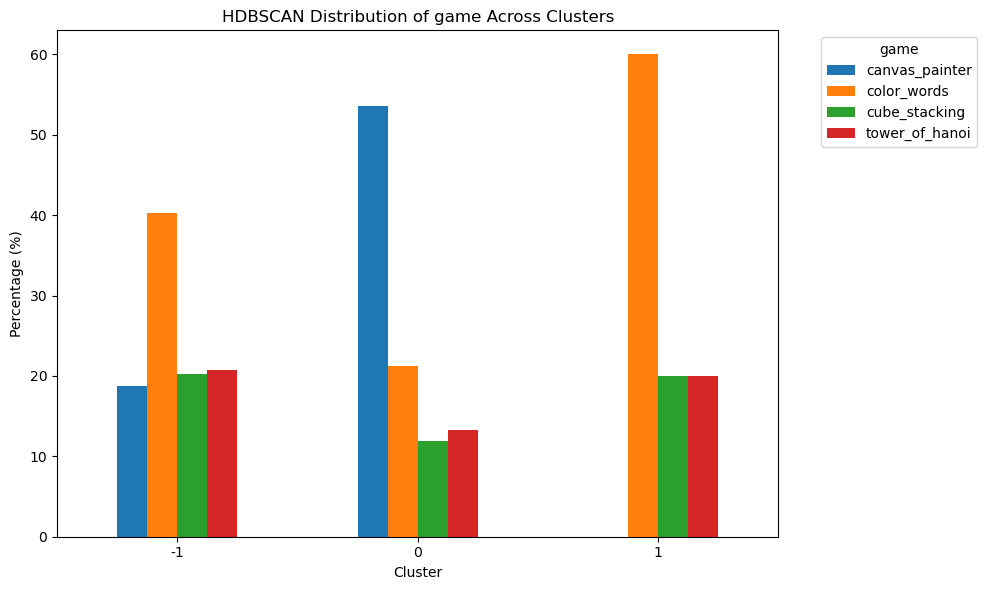


game Distribution by Cluster:


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
-1,18.75,40.24,20.27,20.73
0,53.57,21.23,11.94,13.27
1,0.00,60.00,20.00,20.00


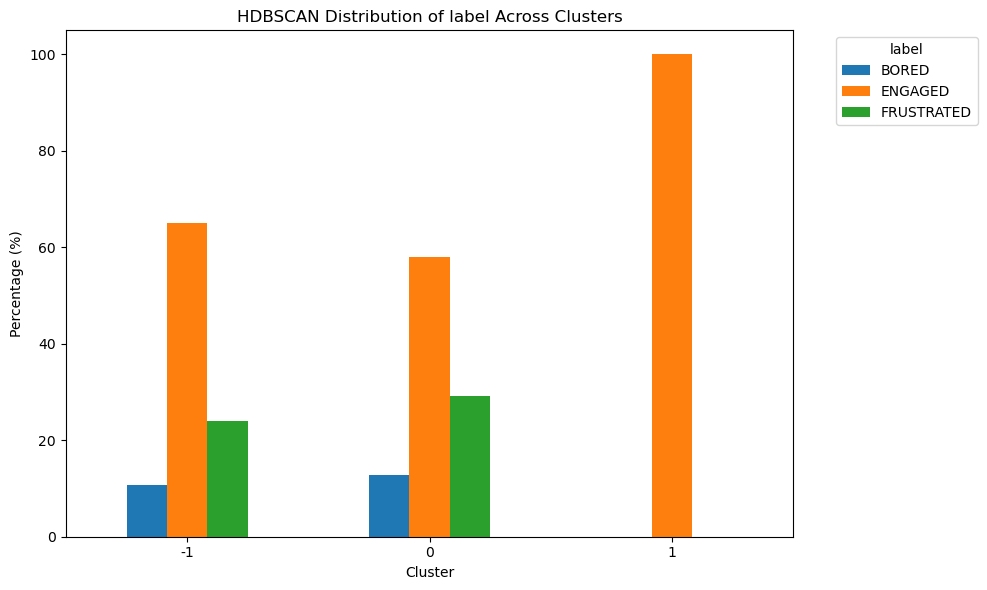


label Distribution by Cluster:


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
-1,10.82,65.09,24.09
0,12.77,57.96,29.27
1,0.00,100.00,0.00


In [16]:
# Cluster analysis of HDBSCAN

hdbscan = HDBSCAN(min_cluster_size=5)
labels_hdbscan = hdbscan.fit_predict(X_scaled)

plot_cluster_distribution(labels_hdbscan, 'HDBSCAN')
plot_clustering(X_scaled, labels_hdbscan, name="HDBSCAN")
plot_cluster_profiles(X_scaled, X_features, labels_hdbscan, name='HDBSCAN')
plot_cluster_characteristics(segments_df, labels_hdbscan, name='HDBSCAN')

## Time series clustering

In [7]:
max_len = max(len(s) for s in segments)

X_ts = np.array([
    np.pad(s, (0, max_len - len(s)), constant_values=np.nan)
    for s in segments
])
    
# Replace NaNs with per-series mean
for i in range(len(X_ts)):
    nan_mask = np.isnan(X_ts[i])
    X_ts[i][nan_mask] = np.nanmean(X_ts[i])


In [8]:
scaler_ts = TimeSeriesScalerMeanVariance()
X_ts_scaled = scaler_ts.fit_transform(X_ts)

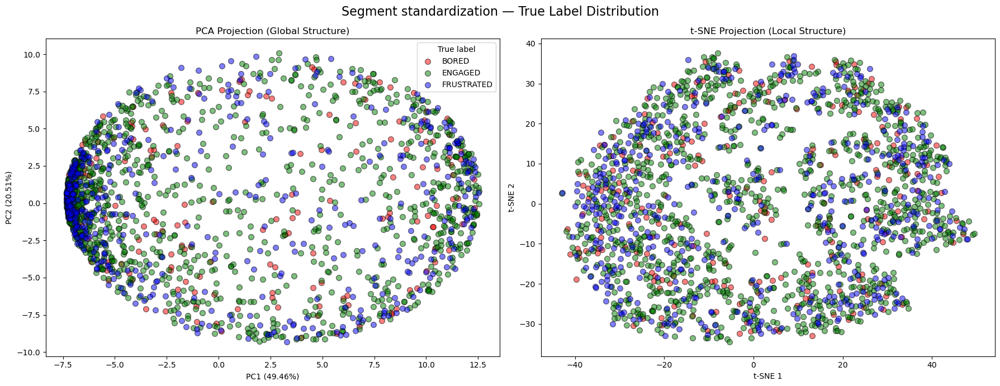

In [9]:
plot_label_distribution(X_ts_scaled[:,:,0], segments_df, name="Segment standardization")

### K-Shape

K = 3
K = 4
K = 5
K = 6
K = 7
K = 8
K = 9
K = 10
K = 11
K = 12
K = 13
K = 14


,k_value,silhouette_score,calinski_harabasz,davies_bouldin
0,3,0.139740,283.932501,6.583629
1,4,0.177559,517.437335,2.940267
2,5,0.154523,400.119875,3.143261
3,6,0.128852,342.731807,3.079630
4,7,0.051559,299.002945,2.939462
5,8,0.070225,282.887807,3.176421
6,9,0.037788,232.616229,3.688049
7,10,0.045442,240.165469,2.860682
8,11,0.081550,225.422442,3.271078
9,12,0.047301,183.128437,4.461052


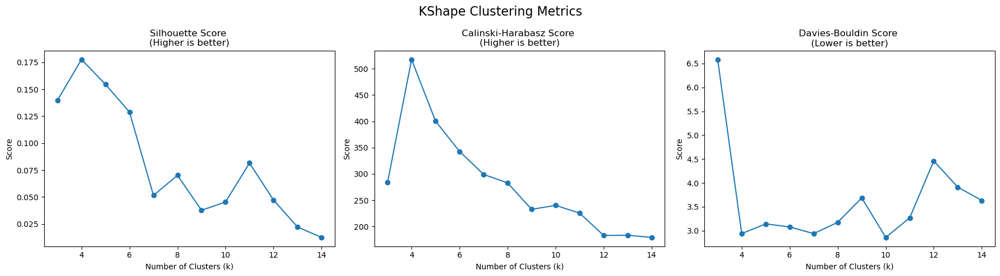

In [20]:
# K-Shape - Optimal k search

kshape_metrics = []

for k in range(3, 15):
    print(f"K = {k}")
    kshape = KShape(n_clusters=k)
    labels = kshape.fit_predict(X_ts_scaled)

    kshape_metrics.append({
        "k_value": k,
        "silhouette_score": silhouette_score(X_ts_scaled[:,:,0], labels),
        "calinski_harabasz": calinski_harabasz_score(X_ts_scaled[:,:,0], labels),
        "davies_bouldin": davies_bouldin_score(X_ts_scaled[:,:,0], labels),
    })

kshape_df = pd.DataFrame(kshape_metrics)
display(kshape_df)

# Plot metrics
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('KShape Clustering Metrics', fontsize=16)

metrics_to_plot = ['silhouette_score', 'calinski_harabasz', 'davies_bouldin']
titles = ['Silhouette Score \n(Higher is better)', 
          'Calinski-Harabasz Score \n(Higher is better)', 
          'Davies-Bouldin Score \n(Lower is better)']

for i, metric in enumerate(metrics_to_plot):
    axes[i].plot(kshape_df['k_value'], kshape_df[metric], marker='o')
    axes[i].set_title(titles[i])
    axes[i].set_xlabel('Number of Clusters (k)')
    axes[i].set_ylabel('Score')

plt.tight_layout()
plt.show()


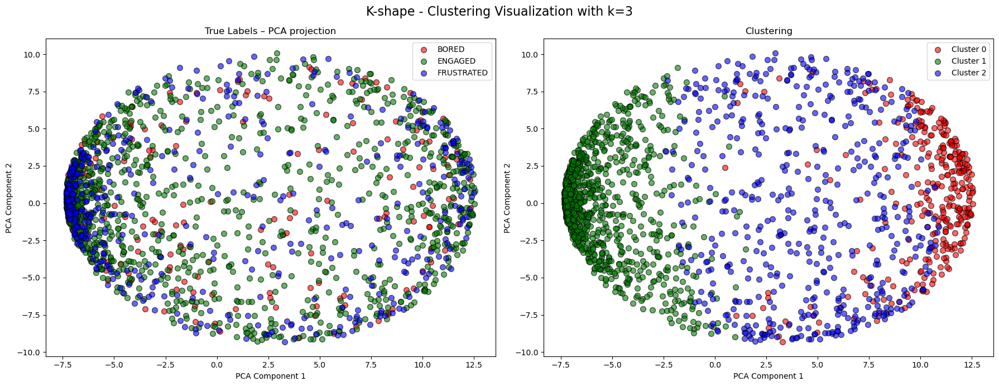

In [17]:
plot_comparison_clustering_true_labels(X_ts_scaled[:,:,0], labels_kshape, segments_df['label'], name="K-shape", k_value=k_optimal, method="PCA")


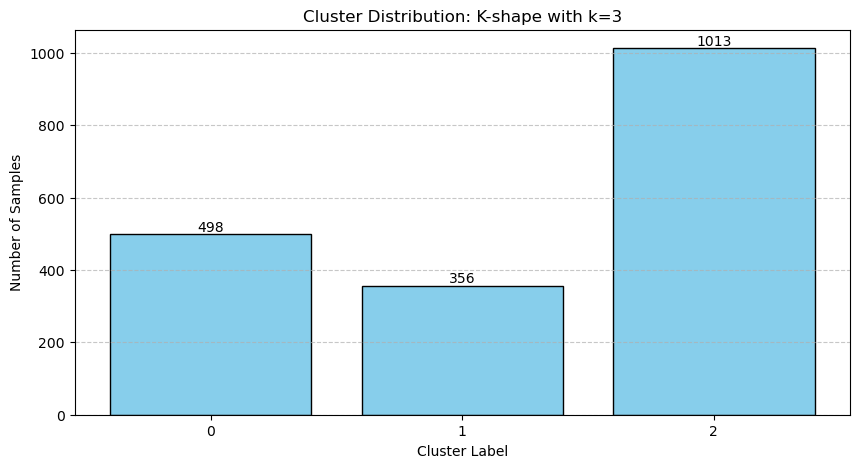

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


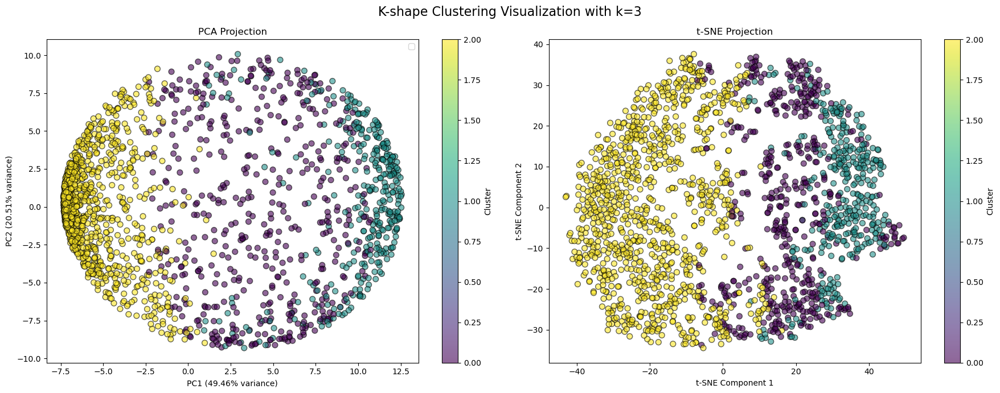

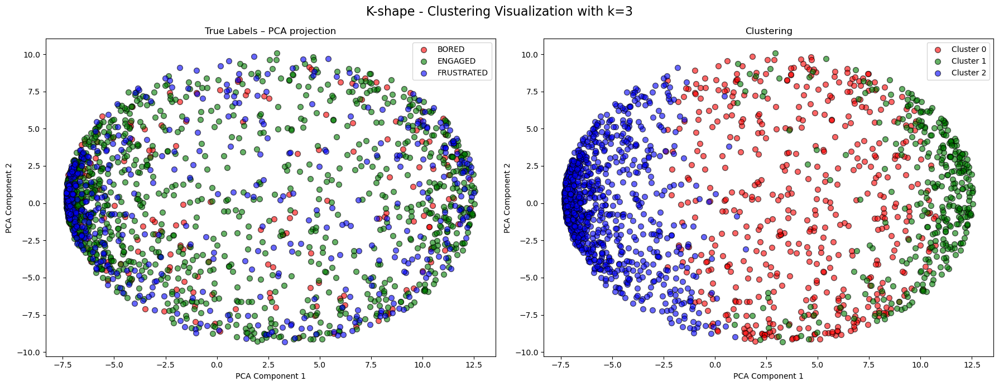

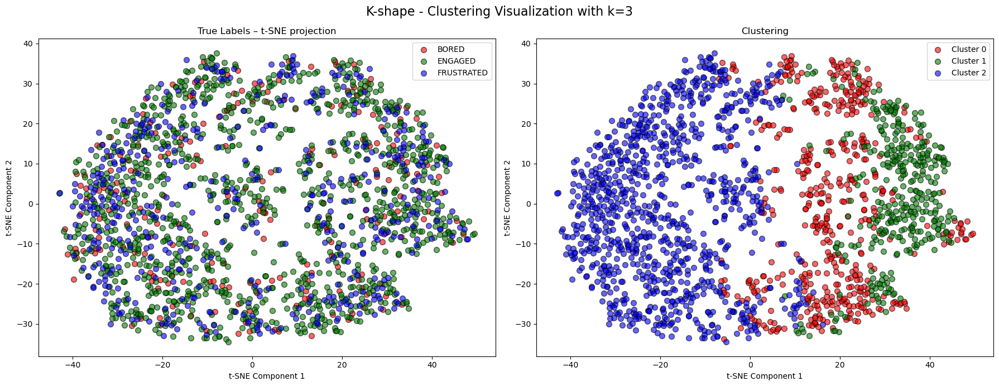

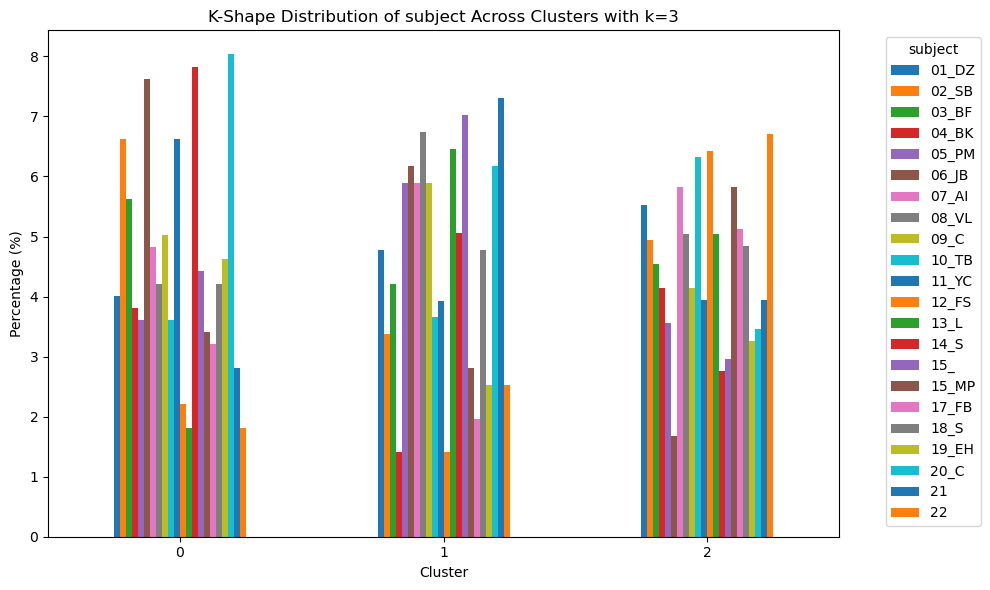


subject Distribution by Cluster (k=3):


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
0,4.02,6.63,5.62,3.82,3.61,7.63,4.82,4.22,5.02,3.61,...,1.81,7.83,4.42,3.41,3.21,4.22,4.62,8.03,2.81,1.81
1,4.78,3.37,4.21,1.40,5.90,6.18,5.90,6.74,5.90,3.65,...,6.46,5.06,7.02,2.81,1.97,4.78,2.53,6.18,7.30,2.53
2,5.53,4.94,4.54,4.15,3.55,1.68,5.82,5.03,4.15,6.32,...,5.03,2.76,2.96,5.82,5.13,4.84,3.26,3.46,3.95,6.71


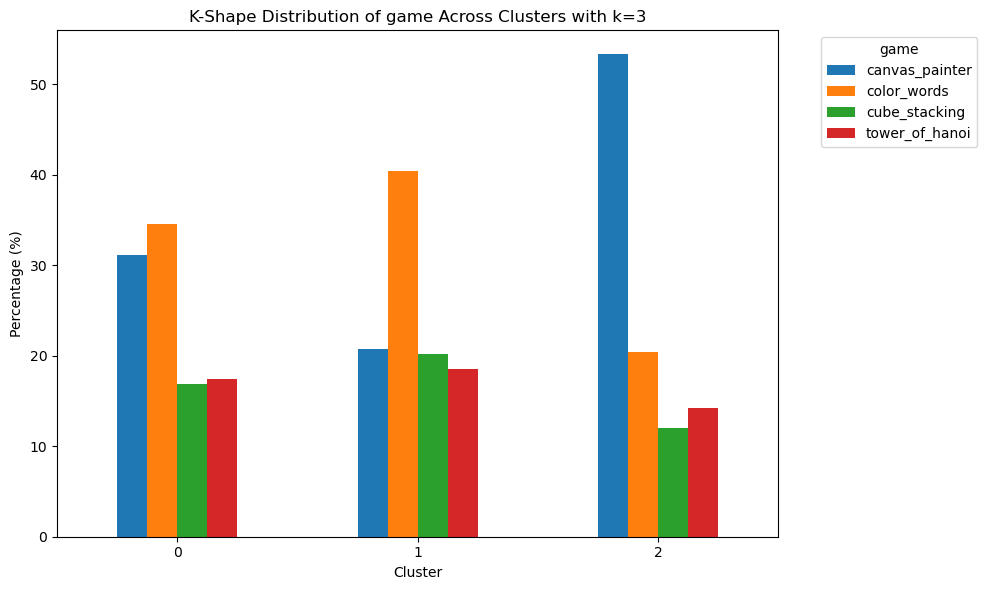


game Distribution by Cluster (k=3):


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
0,31.12,34.54,16.87,17.47
1,20.79,40.45,20.22,18.54
2,53.31,20.43,12.04,14.22


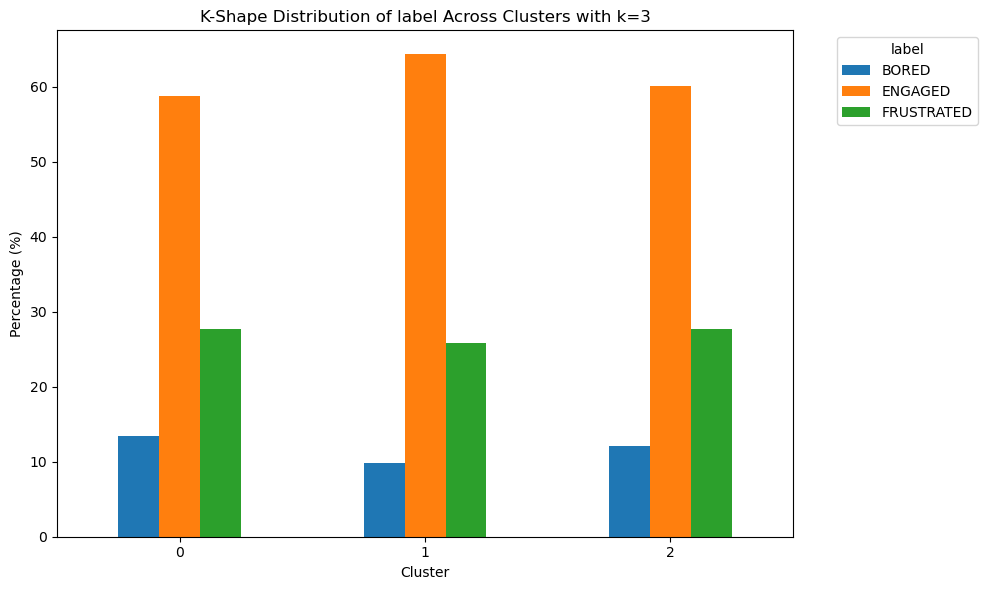


label Distribution by Cluster (k=3):


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
0,13.45,58.84,27.71
1,9.83,64.33,25.84
2,12.14,60.12,27.74


In [18]:

k_optimal = 3
kshape = KShape(n_clusters=k_optimal)
labels_kshape = kshape.fit_predict(X_ts_scaled)

plot_cluster_distribution(labels_kshape, name="K-shape", k_value=k_optimal)
plot_clustering(X_ts_scaled[:,:,0], labels_kshape, name="K-shape", k_value=k_optimal)
plot_comparison_clustering_true_labels(X_ts_scaled[:,:,0], labels_kshape, segments_df['label'], name="K-shape", k_value=k_optimal, method="PCA")
plot_comparison_clustering_true_labels(X_ts_scaled[:,:,0], labels_kshape, segments_df['label'], name="K-shape", k_value=k_optimal, method="t-SNE")
plot_cluster_characteristics(segments_df, labels_kshape, name='K-Shape', k_value=k_optimal)

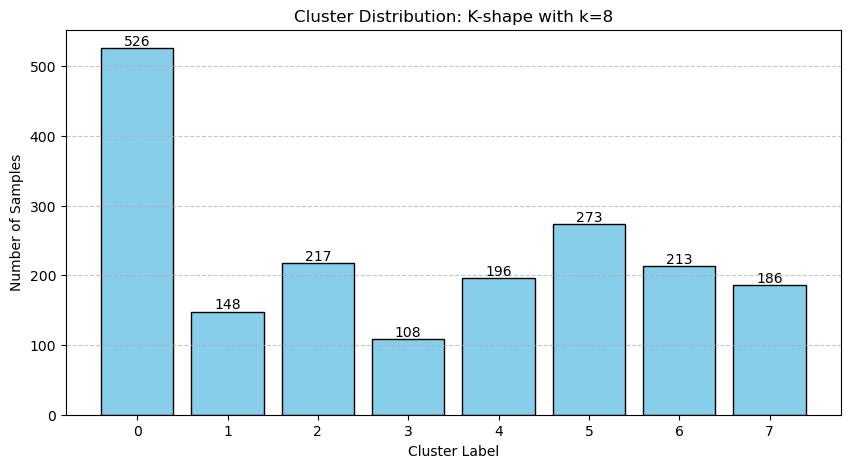

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


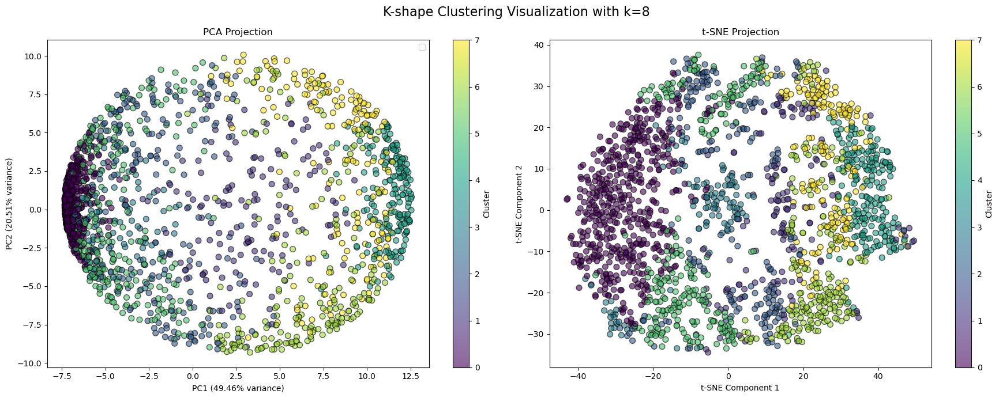

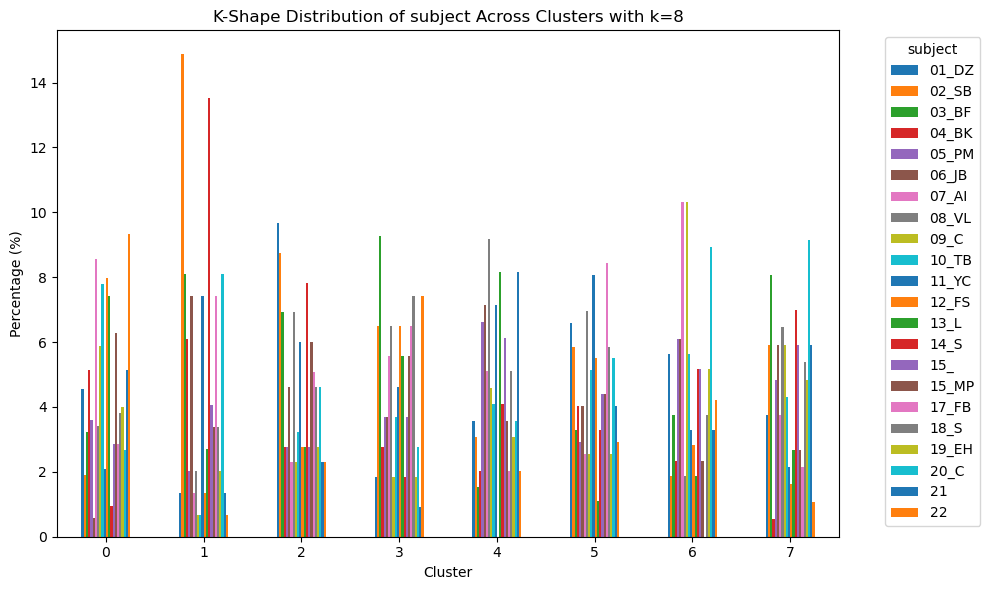


subject Distribution by Cluster (k=8):


subject,01_DZ,02_SB,03_BF,04_BK,05_PM,06_JB,07_AI,08_VL,09_C,10_TB,...,13_L,14_S,15_,15_MP,17_FB,18_S,19_EH,20_C,21,22
Cluster,,,,,,,,,,,,,,,,,,,,,
0,4.56,1.90,3.23,5.13,3.61,0.57,8.56,3.42,5.89,7.79,...,7.41,0.95,2.85,6.27,2.85,3.80,3.99,2.66,5.13,9.32
1,1.35,14.86,8.11,6.08,2.03,7.43,1.35,2.03,0.68,0.68,...,2.70,13.51,4.05,3.38,7.43,3.38,2.03,8.11,1.35,0.68
2,9.68,8.76,6.91,2.76,2.76,4.61,2.30,6.91,2.30,3.23,...,2.76,7.83,2.76,5.99,5.07,4.61,2.76,4.61,2.30,2.30
3,1.85,6.48,9.26,2.78,3.70,3.70,5.56,6.48,1.85,3.70,...,5.56,1.85,3.70,5.56,6.48,7.41,1.85,2.78,0.93,7.41
4,3.57,3.06,1.53,2.04,6.63,7.14,5.10,9.18,4.59,4.08,...,8.16,4.08,6.12,3.57,2.04,5.10,3.06,3.57,8.16,2.04
5,6.59,5.86,3.30,4.03,2.93,4.03,2.56,6.96,2.56,5.13,...,1.10,3.30,4.40,4.40,8.42,5.86,2.56,5.49,4.03,2.93
6,5.63,1.88,3.76,2.35,6.10,6.10,10.33,1.88,10.33,5.63,...,1.88,5.16,5.16,2.35,0.00,3.76,5.16,8.92,3.29,4.23
7,3.76,5.91,8.06,0.54,4.84,5.91,3.76,6.45,5.91,4.30,...,2.69,6.99,5.91,2.69,2.15,5.38,4.84,9.14,5.91,1.08


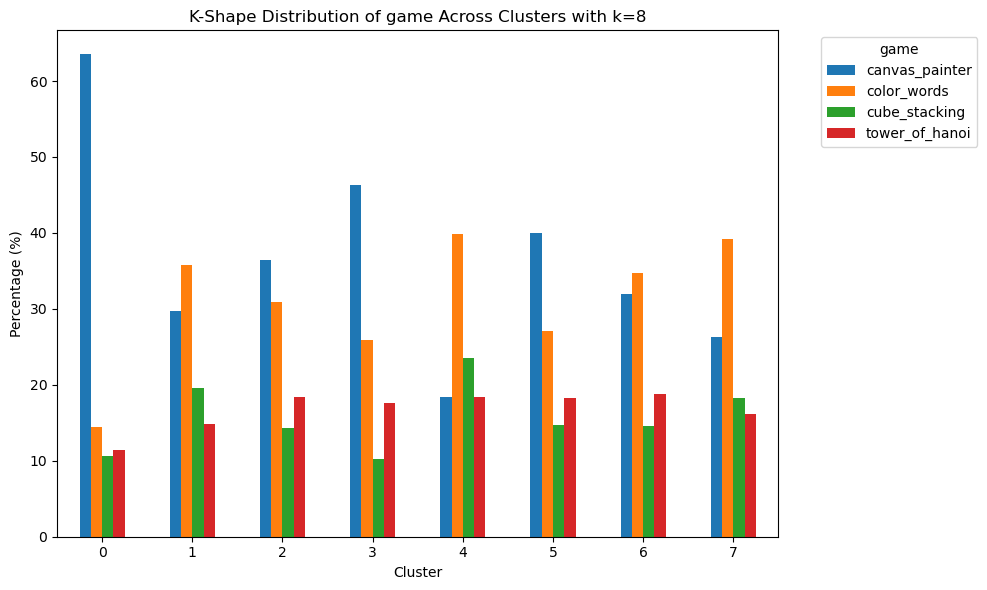


game Distribution by Cluster (k=8):


game,canvas_painter,color_words,cube_stacking,tower_of_hanoi
Cluster,,,,
0,63.50,14.45,10.65,11.41
1,29.73,35.81,19.59,14.86
2,36.41,30.88,14.29,18.43
3,46.30,25.93,10.19,17.59
4,18.37,39.80,23.47,18.37
5,39.93,27.11,14.65,18.32
6,31.92,34.74,14.55,18.78
7,26.34,39.25,18.28,16.13


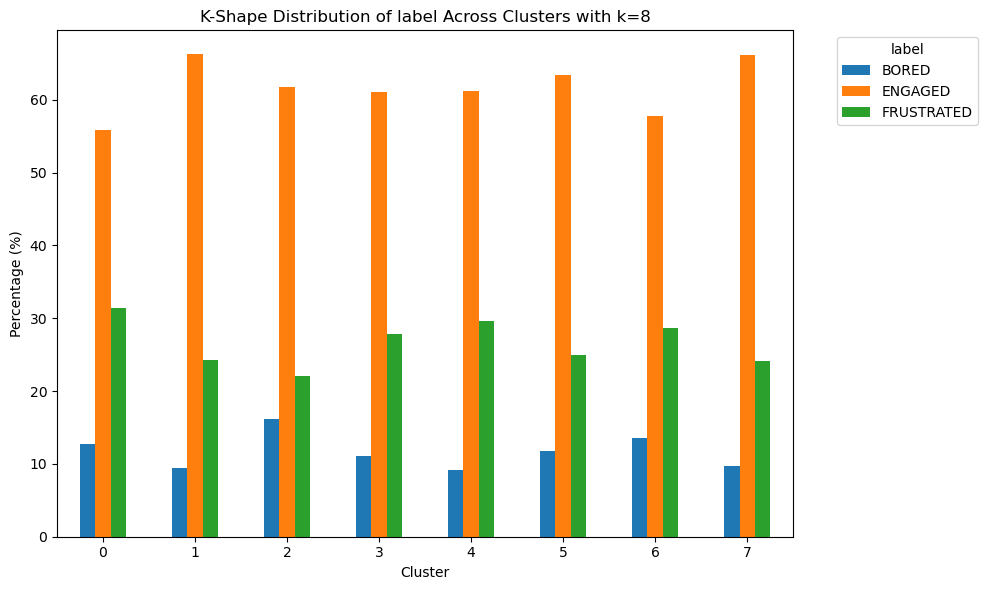


label Distribution by Cluster (k=8):


label,BORED,ENGAGED,FRUSTRATED
Cluster,,,
0,12.74,55.89,31.37
1,9.46,66.22,24.32
2,16.13,61.75,22.12
3,11.11,61.11,27.78
4,9.18,61.22,29.59
5,11.72,63.37,24.91
6,13.62,57.75,28.64
7,9.68,66.13,24.19


In [30]:
k_optimal = 8
kshape = KShape(n_clusters=k_optimal)
labels_kshape = kshape.fit_predict(X_ts_scaled)

plot_cluster_distribution(labels_kshape, name="K-shape", k_value=k_optimal)
plot_clustering(X_ts_scaled[:,:,0], labels_kshape, name="K-shape", k_value=k_optimal)
plot_cluster_characteristics(segments_df, labels_kshape, name='K-Shape', k_value=k_optimal)